# Regression Problem - AirBnB Price Prediction in 3 European Cities

Nightly pricing on Airbnb is a legitimate practice that hosts employ to stay competitive in the short-term rental market. By definition, pricing an Airbnb listing involves structuring rental costs in such a way that they might diverge from what is commonly expected, ultimately seeking to balance occupancy and profitability. The rapid expansion of Airbnb in key European tourism hubs—Barcelona, Paris, and Rome—has been driven by a combination of increased travel demand, liberalized local regulations in some areas, and advancements in technology-based marketplaces. These factors underscore the need to better understand the drivers of Airbnb pricing and how best to forecast them.

In this study, we will investigate whether it is possible to forecast, one year ahead, the average nightly price of Airbnb listings in Barcelona, Paris, and Rome using classic (or “shallow”) Machine Learning methods. As prior research in the short-term rental market suggests, this task is far from trivial.  Accurate predictions of nightly rates may be particularly beneficial not only for hosts aiming to set competitive prices, but also for policymakers and tourism boards monitoring housing market dynamics.

There are many proposed methods in the literature for measuring or defining Airbnb prices. One widely used approach is to track the actual nightly rate displayed on the platform at a given time. Although straightforward, this measure can vary significantly across high and low seasons, and might not always capture discounts or fees that apply only sporadically. Nonetheless, we will use the raw listing price as our key target (endogenous) variable in this study, as it represents the direct cost faced by travelers and the primary revenue source for hosts.

Therefore, the following evaluation metrics for the forecasting problem have been selected: Mean Absolute Error (MAE) and Root Mean Square Error (RMSE). This choice is deliberate: MAE provides a more interpretable measure of average error in currency units, while RMSE penalizes larger individual errors more strongly—an important consideration when trying to anticipate large price fluctuations in highly sought-after tourist seasons. Between these two, RMSE will be of primary importance, as extreme mispricing can have significant impacts on hosts’ income and market fairness.

Ultimately, this problem can be viewed as a form of panel data analysis (covering multiple listings over multiple time periods) that incorporates both cross-sectional and temporal aspects of Airbnb pricing. By exploring this domain, we hope to shed light on how short-term rental prices behave in these iconic European cities, and how Machine Learning can be used to forecast them more effectively.

## Dataset Description

This dataset provides a comprehensive look at Airbnb prices in some of the most popular European cities. Each listing is evaluated for various attributes such as room types, cleanliness and satisfaction ratings, bedrooms, distance from the city centre, and more to capture an in-depth understanding of Airbnb prices on both weekdays and weekends. Using spatial econometric methods, we analyse and identify the determinants of Airbnb prices across these cities.

Our dataset includes information such as:
- room_type- The type of room being offered (e.g. private, shared, etc.). (Categorical)
- room_shared- Whether the room is shared or not. (Boolean)
- room_private- Whether the room is private or not. (Boolean)
- person_capacity- The maximum number of people that can stay in the room. (Numeric)
- host_is_superhost- Whether the host is a superhost or not. (Boolean)
- multi- Whether the listing is for multiple rooms or not. (Boolean)
- biz- Whether the listing is for business purposes or not. (Boolean)
- cleanliness_rating- The cleanliness rating of the listing. (Numeric)
- guest_satisfaction_overall- The overall guest satisfaction rating of the listing. (Numeric)
- bedrooms- The number of bedrooms in the listing. (Numeric)
- dist- The distance from the city centre. (Numeric)
- metro_dist	The distance from the nearest metro station.- (Numeric)
- lng- The longitude of the listing. (Numeric)
- lat- The latitude of the listing. (Numeric)
- is_weekend- Whether the offer referred to weekdays or weekends (Boolean)
- city- city of Airbnb offer (Categorical)

Source: https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities/data
This project will cover panel data fro 3 cities (Barcelona, Paris, Rome)

## Loading Dependencies

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from pathlib import Path
from sklearn.preprocessing import OneHotEncoder
from sklearn import tree
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import f_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import cross_val_score
from itertools import product
from sklearn.ensemble import RandomForestRegressor
from boruta import BorutaPy as bp
import os

from additional_functions import feature_selection

import warnings
warnings.filterwarnings("ignore")

## Loading Data

In [2]:
df1=pd.read_csv("../data/input/barcelona_weekdays.csv")
df1=df1.drop(columns=["Unnamed: 0"])
for i in range(len(df1.realSum)):
    df1["is_weekend"] = 0
    df1["City"] = "Barcelona"

df2 = pd.read_csv("data/input/barcelona_weekends.csv")
df2 = df2.drop(columns=["Unnamed: 0"])
for i in range(len(df2.realSum)):
    df2["is_weekend"] = 1
    df2["City"] = "Barcelona"

df3=pd.read_csv("data/input/paris_weekdays.csv")
df3=df3.drop(columns=["Unnamed: 0"])
for i in range(len(df3.realSum)):
    df3["is_weekend"] = 0
    df3["City"] = "Paris"

df4=pd.read_csv("data/input/paris_weekends.csv")
df4=df4.drop(columns=["Unnamed: 0"])
for i in range(len(df4.realSum)):
    df4["is_weekend"] = 1
    df4["City"] = "Paris"

df5=pd.read_csv("../data/input/rome_weekdays.csv")
df5=df5.drop(columns=["Unnamed: 0"])
for i in range(len(df5.realSum)):
    df5["is_weekend"] = 0
    df5["City"] = "Rome"

df6=pd.read_csv("data/input/rome_weekends.csv")
df6=df6.drop(columns=["Unnamed: 0"])
for i in range(len(df6.realSum)):
    df6["is_weekend"] = 1
    df6["City"] = "Rome"

Combining the datasets to obtain panel data for each city and the final global panel data.

In [3]:
#Final panel data for each city
df_barcelona = pd.concat([df1, df2], ignore_index=True)
df_barcelona.to_csv("data/output/barcelona.csv", index=False)

df_paris = pd.concat([df3, df4], ignore_index=True)
df_paris.to_csv("data/output/paris.csv", index=False)

df_rome = pd.concat([df5, df6], ignore_index=True)
df_rome.to_csv("data/output/rome.csv", index=False)

df = pd.concat([df1, df2, df3, df4, df5, df6], ignore_index=True) #Final panel data
df.to_csv("data/output/DATA.csv", index=False)

Splitting the data into training and testing sets.

In [4]:
df = pd.read_csv("data/output/DATA.csv")
df_train, df_test = train_test_split(df, test_size=0.2, random_state=123)

df_barcelona_train, df_barcelona_test = train_test_split(df_barcelona, test_size=0.2, random_state=123)

df_paris_train, df_paris_test = train_test_split(df_paris, test_size=0.2, random_state=123)

df_rome_train, df_rome_test = train_test_split(df_rome, test_size=0.2, random_state=123)

In [5]:
print("\nTRAIN:")
display(df_train.head())
print("SHAPE:",df_train.shape)

print("\nTEST:")
display(df_test.head())
print("SHAPE:",df_test.shape)


TRAIN:


,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,...,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,is_weekend,City
11292,126.715451,Entire home/apt,False,False,4.0,False,0,0,10.0,100.0,...,3.502522,0.454217,179.811325,3.984654,522.396342,11.374039,12.53763,41.88369,0,Rome
3564,730.030758,Private room,False,True,5.0,False,0,0,8.0,92.0,...,0.515832,0.127760,628.375179,30.589092,1131.080782,66.461783,2.35624,48.85254,0,Paris
12951,172.772543,Entire home/apt,False,False,5.0,False,0,0,9.0,100.0,...,2.361842,0.828980,344.661282,7.637762,783.645121,17.062160,12.50400,41.87965,0,Rome
4691,671.078386,Entire home/apt,False,False,4.0,False,1,0,9.0,100.0,...,1.692157,0.290232,303.089143,14.754277,789.336821,46.381066,2.37554,48.85891,0,Paris
15392,373.366376,Entire home/apt,False,False,6.0,False,0,1,10.0,98.0,...,1.345889,0.199507,770.635042,17.073761,1669.782765,36.380516,12.48700,41.90500,1,Rome


SHAPE: (14838, 21)

TEST:


,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,...,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,is_weekend,City
5820,200.391462,Entire home/apt,False,False,2.0,False,1,0,9.0,95.0,...,3.051790,0.260281,237.210000,11.547303,579.409424,34.045829,2.37726,48.87875,0,Paris
12197,119.935473,Private room,False,True,2.0,False,0,1,9.0,91.0,...,4.689063,0.842425,309.876783,6.866931,730.159067,15.897618,12.44900,41.91500,0,Rome
2249,182.931087,Private room,False,True,2.0,True,0,1,10.0,100.0,...,1.527870,0.147304,389.631842,15.044136,902.524769,19.825437,2.16811,41.37345,1,Barcelona
11902,195.917986,Entire home/apt,False,False,4.0,False,1,0,9.0,91.0,...,2.950948,0.404468,529.666238,11.737508,1399.125171,30.462894,12.46806,41.90818,0,Rome
16863,67.098403,Private room,False,True,2.0,False,0,1,8.0,77.0,...,2.908321,0.687888,191.320383,4.238788,537.667857,11.714478,12.53623,41.90727,1,Rome


SHAPE: (3710, 21)


# Global Data

For now we will focus on the global panel data. We will perform data preprocessing, EDA, feature engineering and feature selection.

## Data Preprocessing

First we will check for missing values, nulls or any discrepancies in the dataset. We observe that analyzed dataset is clean and we do not need to perform any interpolations or fillings.

In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14838 entries, 11292 to 15725
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   realSum                     14838 non-null  float64
 1   room_type                   14838 non-null  object 
 2   room_shared                 14838 non-null  bool   
 3   room_private                14838 non-null  bool   
 4   person_capacity             14838 non-null  float64
 5   host_is_superhost           14838 non-null  bool   
 6   multi                       14838 non-null  int64  
 7   biz                         14838 non-null  int64  
 8   cleanliness_rating          14838 non-null  float64
 9   guest_satisfaction_overall  14838 non-null  float64
 10  bedrooms                    14838 non-null  int64  
 11  dist                        14838 non-null  float64
 12  metro_dist                  14838 non-null  float64
 13  attr_index                  1483

We transform all boolean variables, i.e. "is_weekend", "room_shared", "room_private" and "host_is_superhost" into integers for modelling purposes. Object variables such as "room_type" are transformed into categorical variables.

In [7]:
#Change of boolean variables into integers
df_train["is_weekend"]= df_train["is_weekend"].astype(int)
df_train["room_shared"]= df_train["room_shared"].astype(int)
df_train["room_private"]= df_train["room_private"].astype(int)
df_train["host_is_superhost"]= df_train["host_is_superhost"].astype(int)

#Change of object variables into categorical
df_train['room_type'] = df_train['room_type'].map({'Private room': 1,'Entire home/apt':2}).fillna(3)
df_train["room_type"]= df_train["room_type"].astype(int)
df_train.room_type.isna().sum()

np.int64(0)

In [8]:
#Similar transformations for each city dataset
df_barcelona_train["is_weekend"]= df_barcelona_train["is_weekend"].astype(int)
df_barcelona_train["room_shared"]= df_barcelona_train["room_shared"].astype(int)
df_barcelona_train["room_private"]= df_barcelona_train["room_private"].astype(int)
df_barcelona_train["host_is_superhost"]= df_barcelona_train["host_is_superhost"].astype(int)

df_barcelona_train['room_type'] = df_barcelona_train['room_type'].map({'Private room': 1,'Entire home/apt':2}).fillna(3)
df_barcelona_train["room_type"]= df_barcelona_train["room_type"].astype(int)
df_barcelona_train.room_type.isna().sum()

df_paris_train["is_weekend"]= df_paris_train["is_weekend"].astype(int)
df_paris_train["room_shared"]= df_paris_train["room_shared"].astype(int)
df_paris_train["room_private"]= df_paris_train["room_private"].astype(int)
df_paris_train["host_is_superhost"]= df_paris_train["host_is_superhost"].astype(int)

df_paris_train['room_type'] = df_paris_train['room_type'].map({'Private room': 1,'Entire home/apt':2}).fillna(3)
df_paris_train["room_type"]= df_paris_train["room_type"].astype(int)
df_paris_train.room_type.isna().sum()

df_rome_train["is_weekend"]= df_rome_train["is_weekend"].astype(int)
df_rome_train["room_shared"]= df_rome_train["room_shared"].astype(int)
df_rome_train["room_private"]= df_rome_train["room_private"].astype(int)
df_rome_train["host_is_superhost"]= df_rome_train["host_is_superhost"].astype(int)

df_rome_train['room_type'] = df_rome_train['room_type'].map({'Private room': 1,'Entire home/apt':2}).fillna(3)
df_rome_train["room_type"]= df_rome_train["room_type"].astype(int)
df_rome_train.room_type.isna().sum()


np.int64(0)

In [9]:
#Dropping out initial indices as we have standardized forms
df_train=df_train.drop(columns=["attr_index", 'attr_index_norm'])
df_train=df_train.drop(columns=["rest_index", 'rest_index_norm'])

We add a new feature "city", which will be categorizing AirBnB listings to each city.

In [10]:
df_train['City'] = df_train['City'].map({'Barcelona': 1,'Paris':2, 'Rome':3})

Finally, checking whether every variable has proper type.

In [11]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14838 entries, 11292 to 15725
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   realSum                     14838 non-null  float64
 1   room_type                   14838 non-null  int64  
 2   room_shared                 14838 non-null  int64  
 3   room_private                14838 non-null  int64  
 4   person_capacity             14838 non-null  float64
 5   host_is_superhost           14838 non-null  int64  
 6   multi                       14838 non-null  int64  
 7   biz                         14838 non-null  int64  
 8   cleanliness_rating          14838 non-null  float64
 9   guest_satisfaction_overall  14838 non-null  float64
 10  bedrooms                    14838 non-null  int64  
 11  dist                        14838 non-null  float64
 12  metro_dist                  14838 non-null  float64
 13  lng                         1483

## Target variable analysis

We will analyze the target variable "realSum" which is the price of the AirBnB offer. We will check the distribution of the variable and decide whether any transformations are needed. We will also check for outliers.

In [12]:
df_train.realSum.describe()

count    14838.000000
mean       285.849348
std        276.677124
min         46.057092
25%        161.984779
50%        225.375821
75%        332.394267
max      16445.614689
Name: realSum, dtype: float64

Based on the basic descriptive analysis, we suppose the occurence of outliers.

<Axes: >

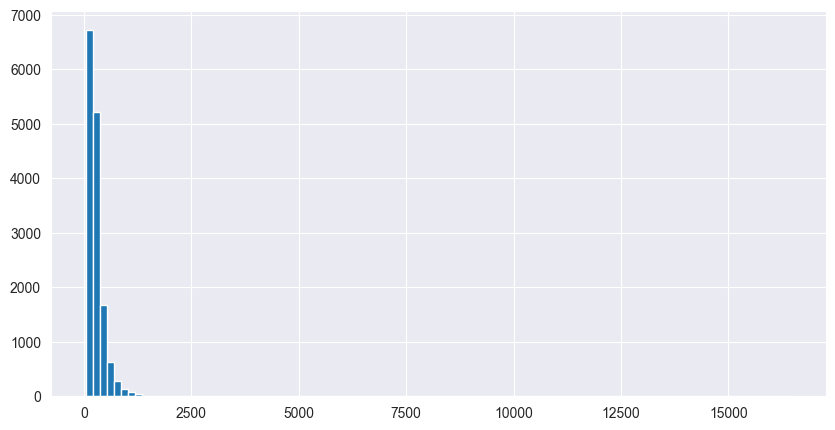

In [13]:
df_train.realSum.hist(bins=100, figsize=(10, 5)) #need of clipping

In [14]:
{i: df_train.realSum.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(500.1666722911209),
 np.float64(0.91): np.float64(520.6056016566831),
 np.float64(0.92): np.float64(546.891602199646),
 np.float64(0.93): np.float64(573.4458010998229),
 np.float64(0.9400000000000001): np.float64(606.6129182589236),
 np.float64(0.9500000000000001): np.float64(648.9770714884891),
 np.float64(0.9600000000000001): np.float64(697.0733525957701),
 np.float64(0.9700000000000001): np.float64(767.9056019736175),
 np.float64(0.9800000000000001): np.float64(877.5505891047775),
 np.float64(0.9900000000000001): np.float64(1093.9818314637434)}

We see that only 1% of the data is larger than 1000. We can create a cutoff at the 99% quantile, to get rid of outliers.

In [15]:
cutoff_realSum = df_train.realSum.quantile(0.99)
df_train['realSum_Cut']=df_train['realSum'].clip(upper=cutoff_realSum)

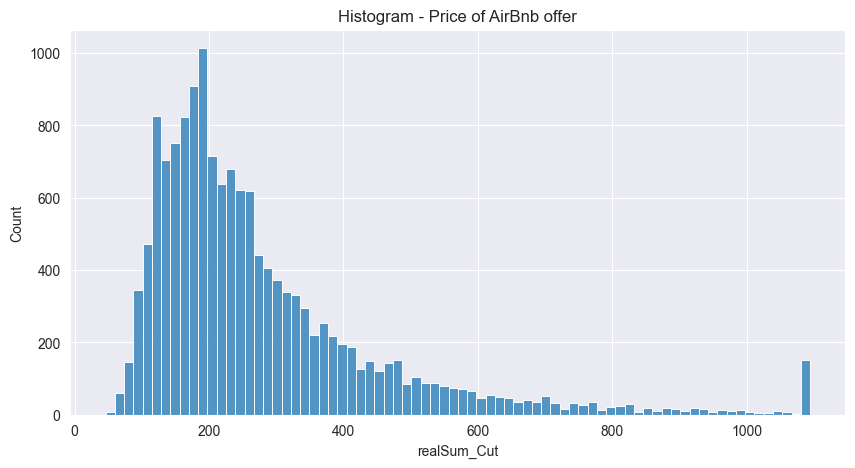

In [16]:
plt.figure(figsize=(10, 5))
sns.histplot(df_train.realSum_Cut).set(title="Histogram - Price of AirBnb offer")
plt.show()

For our further analysis, we will use new, trimmed target variable, "realSum_Cut".

In [17]:
df_train=df_train.drop(columns=["realSum"])

## Exploratory Data Analysis (EDA)

In this section we will perform data analysis on our dataset, to better understand the nature and behavior of our data. We will look for any missing values, discrepancies, outliers. Necessary data transformations will be applied to enhance the quality of the data.

Let's start with some plots!

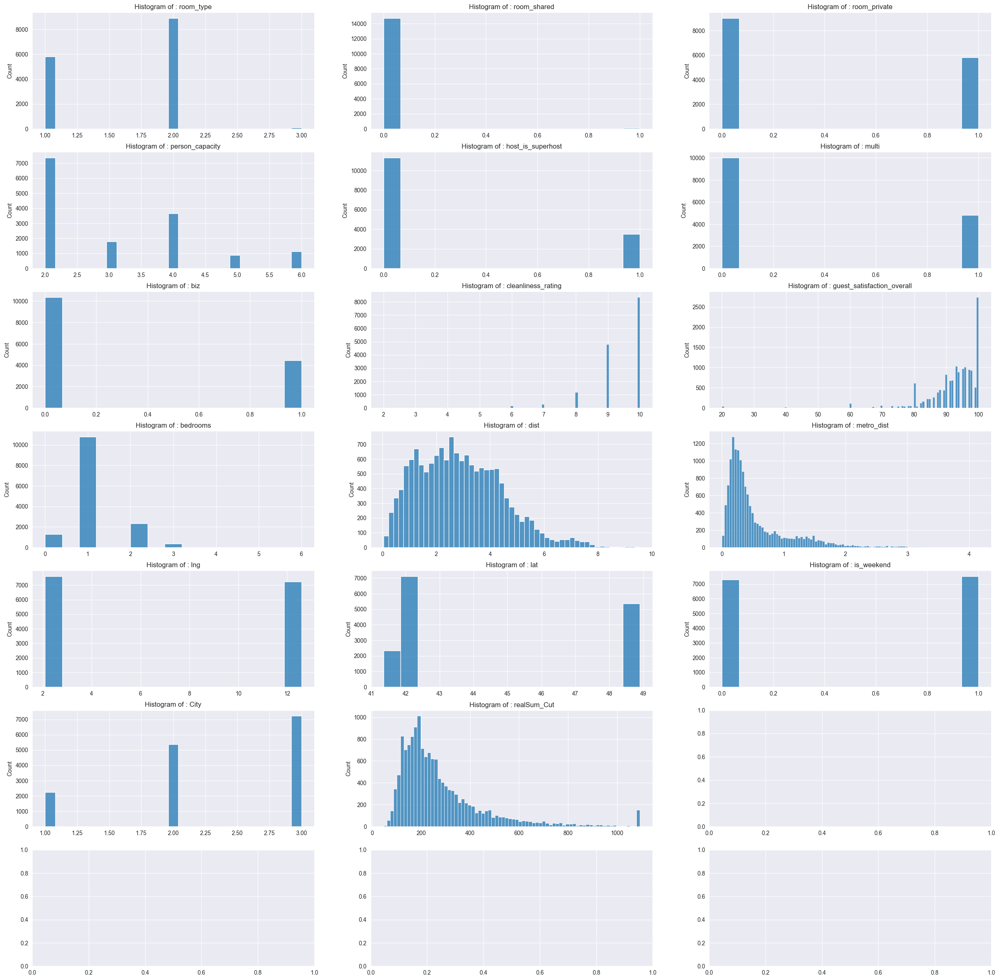

In [18]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_train.columns, axes.flat):
    sns.histplot(x=df_train[i], ax=ax).set(title=f"Histogram of : {i}", xlabel="")
plt.show()

From the histograms, we can see that:
- type 3 in the variable "room_type" is insignificant - we can transform it to the binary discrete variable;
- less than 100 of listings are shared rooms, which is insignificant for the whole dataset (14838 records);
- "cleanlines_rating" and "guest_satisfaction_rating" are concentrated in the left half of the histogram - we can change the range of the spectrum.

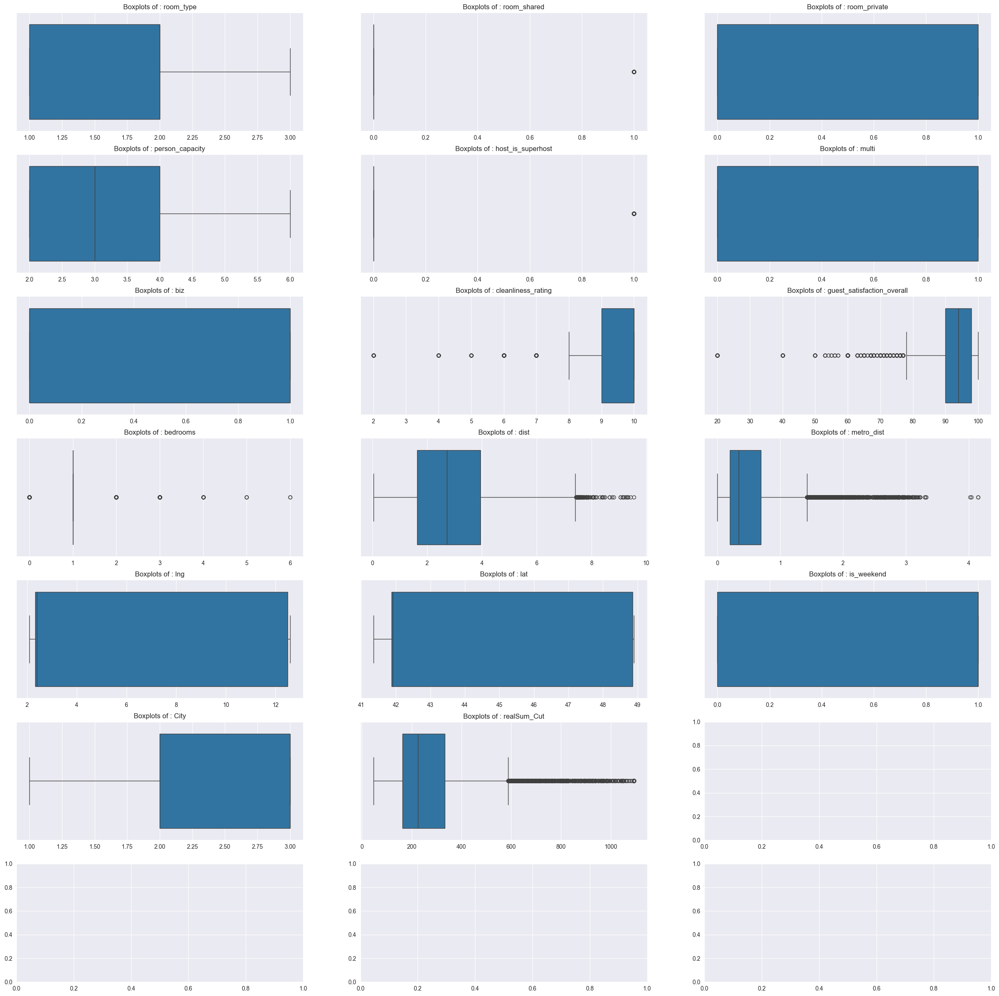

In [19]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_train.columns, axes.flat):
    sns.boxplot(x=df_train[i], ax=ax).set(title=f"Boxplots of : {i}", xlabel="")
plt.show()

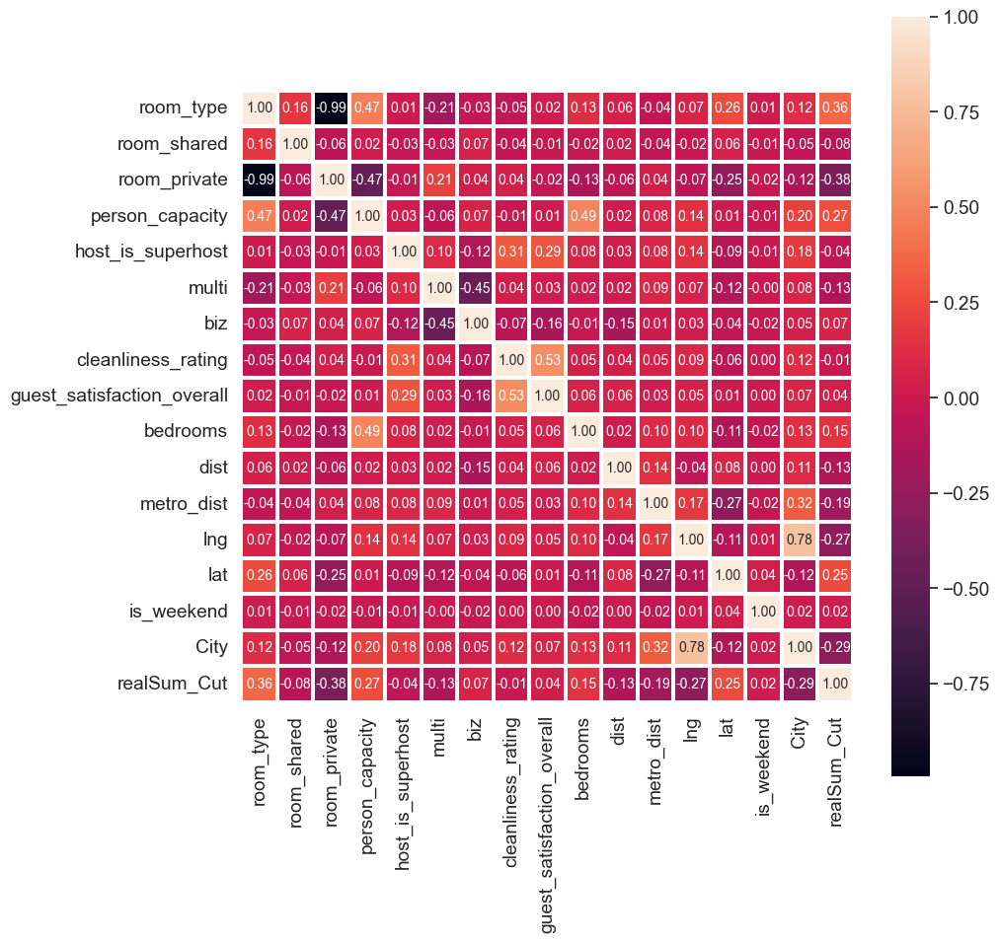

In [20]:
corr = df_train.corr(method="kendall")

plt.figure(figsize=(10,10))
sns.set(font_scale=1.25)
sns.heatmap(
    corr, linewidths=1.5, annot=True, square=True, fmt=".2f", annot_kws={"size": 10}
)
plt.show()

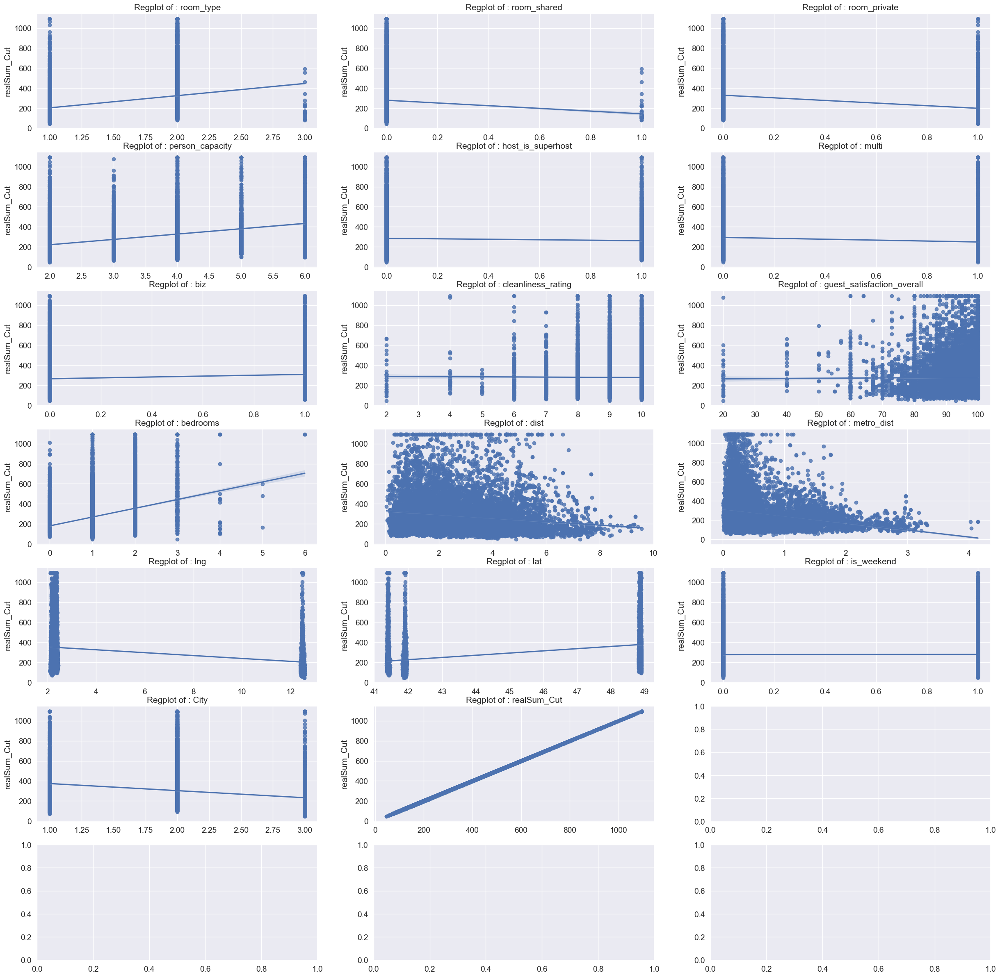

In [21]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_train.columns, axes.flat):
    sns.regplot(x=df_train[i], y=df_train["realSum_Cut"], ax=ax).set(title=f"Regplot of : {i}", xlabel="")
plt.show()

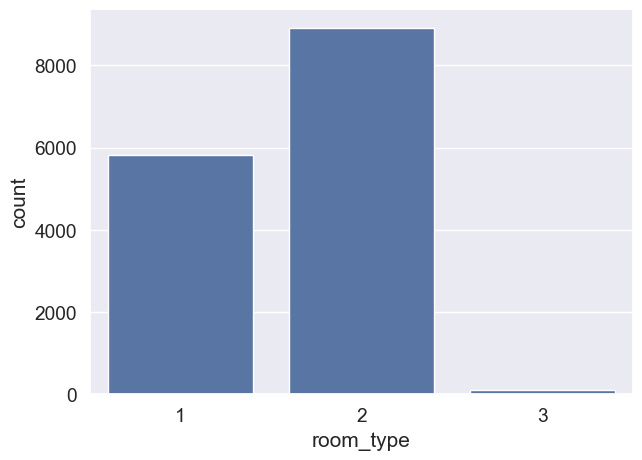

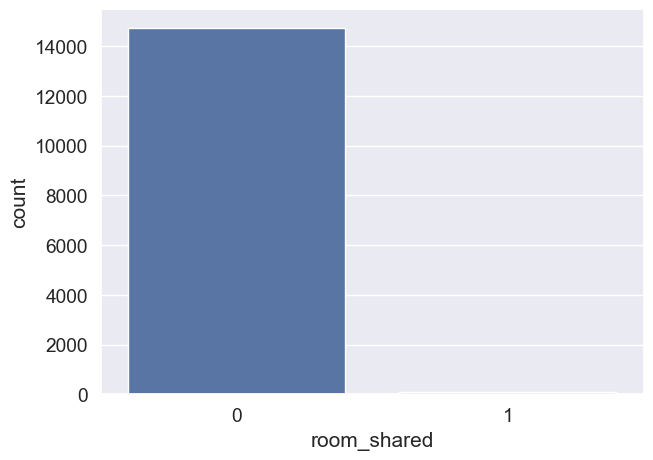

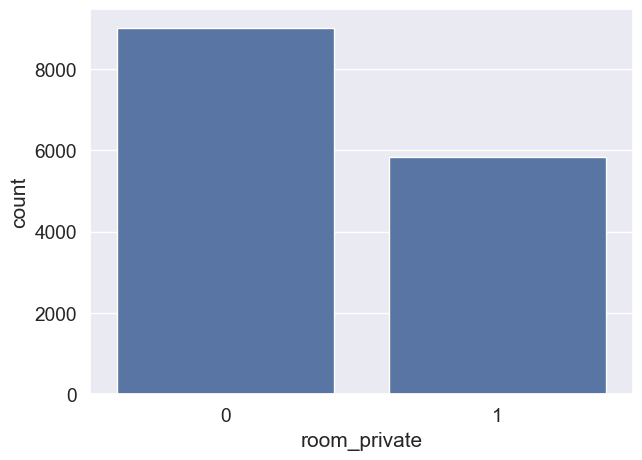

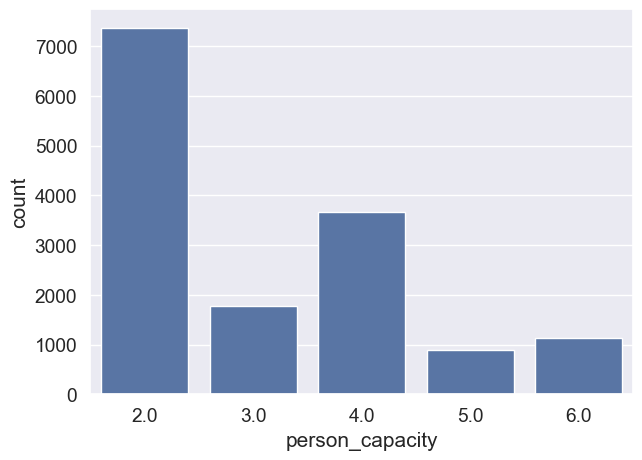

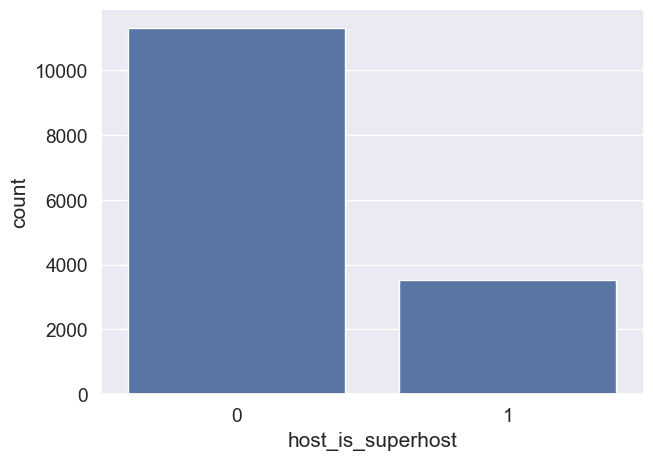

...

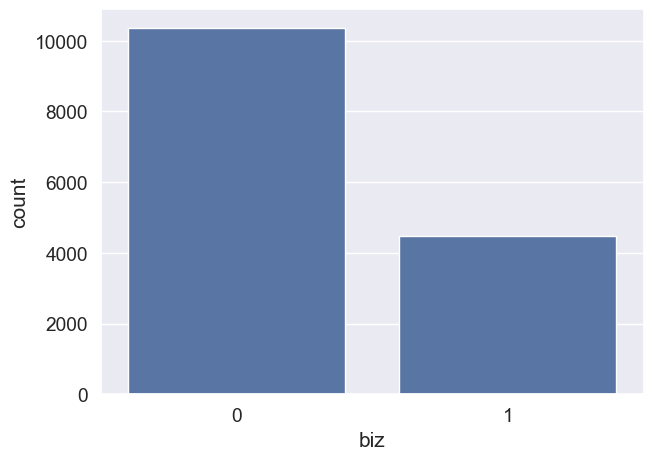

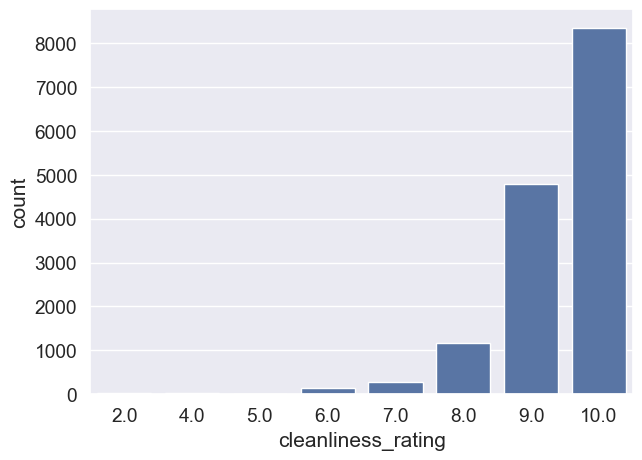

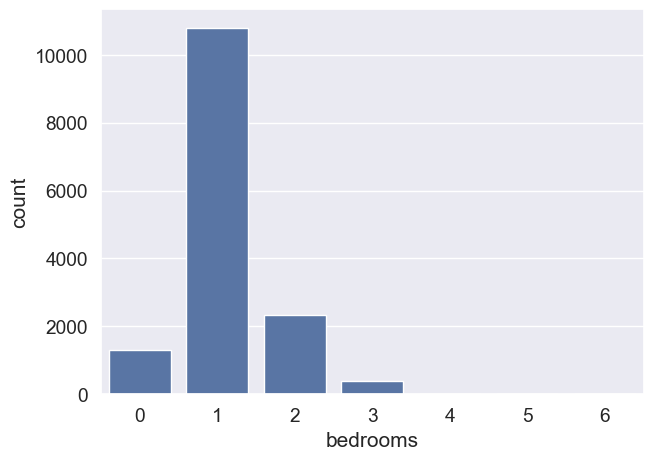

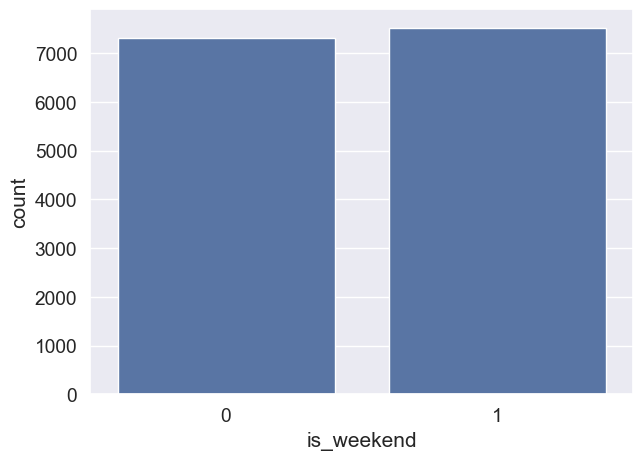

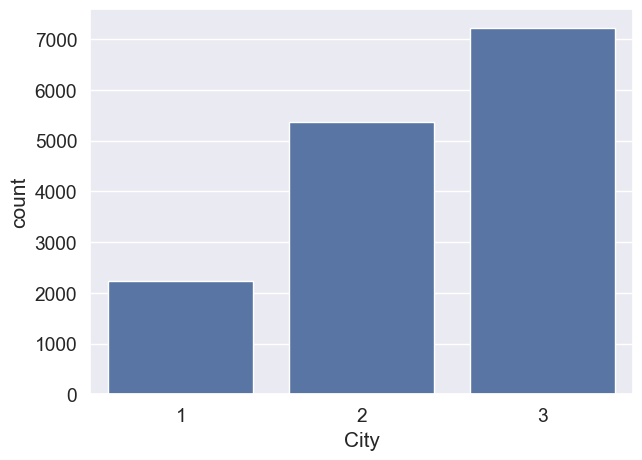

In [22]:
#Plots for categorical variables
Col= ['room_type', 'room_shared','room_private','person_capacity','host_is_superhost','multi', 'biz', 'cleanliness_rating', 'bedrooms', 'is_weekend', 'City' ]
for col in Col:
    plt.figure(figsize=(7,5))
    sns.countplot(x=col, data=df_train)
    plt.show()

## Feature Engineering

In this section we will present feature engineering process. We will transform some variables, based on the observations in the EDA process. First, we will focus on the one dimensional approach.

Categorical Variables

1) Bedrooms

In [23]:
df_train.bedrooms.describe()

count    14838.000000
mean         1.126432
std          0.591030
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          6.000000
Name: bedrooms, dtype: float64

In [24]:
{i: df_train.bedrooms.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(2.0),
 np.float64(0.91): np.float64(2.0),
 np.float64(0.92): np.float64(2.0),
 np.float64(0.93): np.float64(2.0),
 np.float64(0.9400000000000001): np.float64(2.0),
 np.float64(0.9500000000000001): np.float64(2.0),
 np.float64(0.9600000000000001): np.float64(2.0),
 np.float64(0.9700000000000001): np.float64(2.0),
 np.float64(0.9800000000000001): np.float64(3.0),
 np.float64(0.9900000000000001): np.float64(3.0)}

We see that AirBnBs with more than 3 bedroom are pretty rare, i.e. less than 1% of the observations. To avoid any problems with model fitting, we will apply the upper cutoff at the level of 0.99 quantile.

In [25]:
cutoff_bedrooms = df_train.bedrooms.quantile(0.99)
df_train['bedrooms']=df_train['bedrooms'].clip(upper=cutoff_bedrooms)

2) Cleanliness Rating

In [26]:
df_train.cleanliness_rating.describe()

count    14838.000000
mean         9.385564
std          0.916887
min          2.000000
25%          9.000000
50%         10.000000
75%         10.000000
max         10.000000
Name: cleanliness_rating, dtype: float64

In [27]:
{i: df_train.cleanliness_rating.quantile(i) for i in np.arange(0.0, 0.1, 0.01)}

{np.float64(0.0): np.float64(2.0),
 np.float64(0.01): np.float64(6.0),
 np.float64(0.02): np.float64(7.0),
 np.float64(0.03): np.float64(7.0),
 np.float64(0.04): np.float64(8.0),
 np.float64(0.05): np.float64(8.0),
 np.float64(0.06): np.float64(8.0),
 np.float64(0.07): np.float64(8.0),
 np.float64(0.08): np.float64(8.0),
 np.float64(0.09): np.float64(8.0)}

Overall, the cleanliness of the AirBnBs is rated as good - only 1% of observations has a cleanliness ranking below 6/10. In this situation, without loss of generality, we can apply the lower cutoff at 0.01 quantile.

In [28]:
cutoff_cleanliness_rating = df_train.cleanliness_rating.quantile(0.01)
df_train['cleanliness_rating']=df_train['cleanliness_rating'].clip(lower=cutoff_cleanliness_rating)

3) Room Shared

As noted in the EDA section, variable "room_shared" has very imbalanced distribution - only 0.6% of the observations are shared rooms. Without loss of generality, we can exclude this variable from our dataset.

In [29]:
{i: df_train.room_shared.quantile(i) for i in np.arange(0.99, 1.0, 0.001)}

{np.float64(0.99): np.float64(0.0),
 np.float64(0.991): np.float64(0.0),
 np.float64(0.992): np.float64(0.0),
 np.float64(0.993): np.float64(0.0),
 np.float64(0.994): np.float64(1.0),
 np.float64(0.995): np.float64(1.0),
 np.float64(0.996): np.float64(1.0),
 np.float64(0.997): np.float64(1.0),
 np.float64(0.998): np.float64(1.0),
 np.float64(0.999): np.float64(1.0),
 np.float64(1.0): np.float64(1.0)}

In [30]:
df_train=df_train.drop(columns=["room_shared"])

4) Room Type

As noted in the EDA section, we will transform the variable "room_type" to bicategorical variable, while type 3 insignificant comparing to the whole dataset.

In [31]:
df_train['room_type']=df_train['room_type'].clip(upper=2)

Let's check how the histograms of the categorical values look after applied transformations.

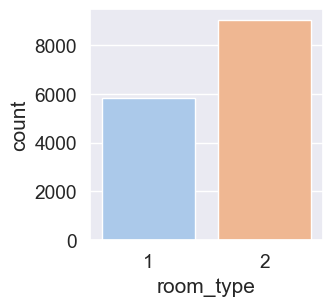

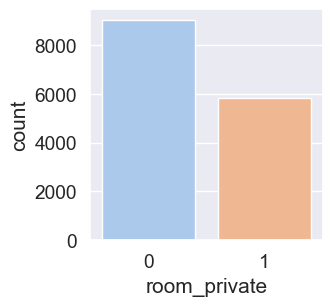

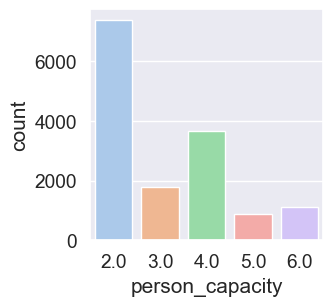

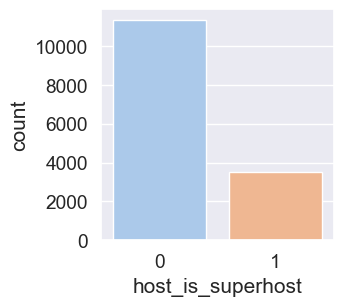

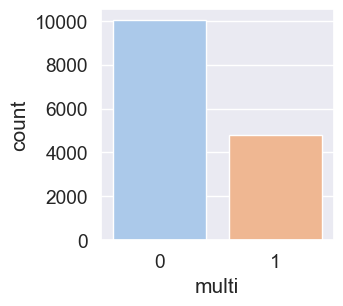

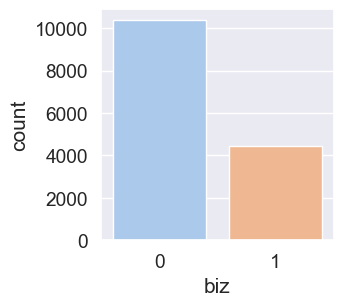

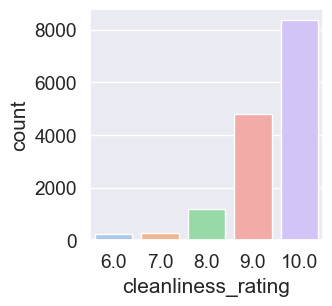

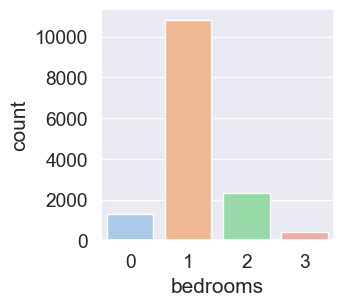

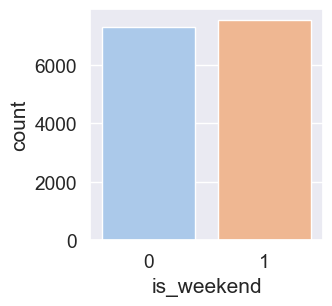

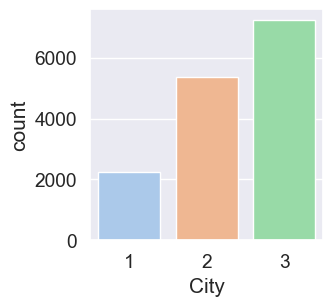

In [32]:
#Plots after categorical changes
Col= ['room_type','room_private','person_capacity','host_is_superhost','multi', 'biz', 'cleanliness_rating', 'bedrooms', 'is_weekend', 'City' ]
for col in Col:
    plt.figure(figsize=(3,3))
    sns.countplot(x=col,data=df_train, palette="pastel")
    plt.show()

Look pretty decent and balanced! Let's proceed with the feature engineering of the continuous variables.

Approximation of coordinates
- Barcelona: lng 2,11; lat 41,24
- Paris: lng 2,21; lat 48,52
- Rome: lng 12,30; lat 41,54

We create longitude and latitude bins (3 for each variable) and turn them into categorical variable. We want to measure how particular region can influence the price of the AirBnB.

In [33]:
#lng
_, longitude_bins = pd.qcut(df_train.lng, q=3, retbins=True)

df_train["Longitude_disc"] = pd.cut(df_train.lng, longitude_bins)

df_train = pd.get_dummies(df_train, columns=["Longitude_disc"], drop_first=False)

In [34]:
#lat
_, latitude_bins = pd.qcut(df_train.lat, q=3, retbins=True)

df_train["Latitude_disc"] = pd.cut(df_train.lat, latitude_bins)

df_train = pd.get_dummies(df_train, columns=["Latitude_disc"], drop_first=False)

In [35]:
df_train.sample(20)

,room_type,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,...,lat,is_weekend,City,realSum_Cut,"Longitude_disc_(2.093, 2.347]","Longitude_disc_(2.347, 12.47]","Longitude_disc_(12.47, 12.583]","Latitude_disc_(41.35, 41.893]","Latitude_disc_(41.893, 48.837]","Latitude_disc_(48.837, 48.901]"
7801,2,0,3.0,0,0,0,10.0,99.0,2,2.515917,...,48.87632,1,2,266.567248,False,True,False,False,False,True
4163,2,0,2.0,0,0,0,9.0,91.0,1,3.164127,...,48.88487,0,2,175.925063,False,True,False,False,False,True
14966,2,0,4.0,0,0,0,9.0,94.0,1,2.281461,...,41.90900,1,3,239.637154,False,False,True,False,True,False
2540,1,1,2.0,0,0,1,10.0,80.0,1,2.004602,...,41.39335,1,1,328.624293,True,False,False,True,False,False
9034,2,0,2.0,0,0,0,10.0,97.0,1,6.963956,...,48.84191,1,2,312.936900,True,False,False,False,False,True
1704,1,1,2.0,0,1,0,9.0,89.0,2,2.123773,...,41.40542,1,1,132.892685,True,False,False,True,False,False
7631,2,0,2.0,0,0,1,10.0,87.0,0,2.651818,...,48.87936,1,2,348.121913,True,False,False,False,False,True
9061,2,0,4.0,0,1,0,10.0,83.0,1,3.401926,...,48.88669,1,2,520.551776,True,False,False,False,False,True
6113,2,0,6.0,0,0,0,9.0,91.0,2,0.622471,...,48.85552,1,2,1093.981831,True,False,False,False,False,True
4052,1,1,5.0,0,0,1,8.0,80.0,1,2.792177,...,48.87983,0,2,565.523348,True,False,False,False,False,True


Final "cleaning"

We minimize the size of the final dataset, for easier modelling process.

In [36]:
#Downcast of dataframe
def downcast_dataframe(data):
    # Source: https://www.kaggle.com/anshuls235/time-series-forecasting-eda-fe-modelling
    df = data.copy()

    print("BEFORE downcast")
    print(df.info(memory_usage="deep"))
    print("=================")
    print("=================", "\n")

    cols = df.dtypes.index.tolist()
    types = df.dtypes.values.tolist()
    for i, t in enumerate(types):
        # Integer
        if "int" in str(t):
            # Check if minimum and maximum are in the limit of int8
            if (
                df[cols[i]].min() > np.iinfo(np.int8).min
                and df[cols[i]].max() < np.iinfo(np.int8).max
            ):
                df[cols[i]] = df[cols[i]].astype(np.int8)
            # Check if minimum and maximum are in the limit of int16
            elif (
                df[cols[i]].min() > np.iinfo(np.int16).min
                and df[cols[i]].max() < np.iinfo(np.int16).max
            ):
                df[cols[i]] = df[cols[i]].astype(np.int16)
            # Check if minimum and maximum are in the limit of int32
            elif (
                df[cols[i]].min() > np.iinfo(np.int32).min
                and df[cols[i]].max() < np.iinfo(np.int32).max
            ):
                df[cols[i]] = df[cols[i]].astype(np.int32)
            # Choose int64
            else:
                df[cols[i]] = df[cols[i]].astype(np.int64)
        # Float
        elif "float" in str(t):
            if (
                df[cols[i]].min() > np.finfo(np.float32).min
                and df[cols[i]].max() < np.finfo(np.float32).max
            ):
                df[cols[i]] = df[cols[i]].astype(np.float32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.float64)
        # Object
        elif t == object:
            if cols[i] == "date":
                df[cols[i]] = pd.to_datetime(df[cols[i]], format="%Y-%m-%d")
            else:
                df[cols[i]] = df[cols[i]].astype("category")
    print("AFTER downcast")
    print(df.info(memory_usage="deep"))
    return df

In [37]:
df_train = downcast_dataframe(df_train)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 14838 entries, 11292 to 15725
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   room_type                       14838 non-null  int64  
 1   room_private                    14838 non-null  int64  
 2   person_capacity                 14838 non-null  float64
 3   host_is_superhost               14838 non-null  int64  
 4   multi                           14838 non-null  int64  
 5   biz                             14838 non-null  int64  
 6   cleanliness_rating              14838 non-null  float64
 7   guest_satisfaction_overall      14838 non-null  float64
 8   bedrooms                        14838 non-null  int64  
 9   dist                            14838 non-null  float64
 10  metro_dist                      14838 non-null  float64
 11  lng                             14838 non-null  float64
 12  lat              

We create a function to apply all discussed changes to the test set.

In [38]:
def transformations(df_test, longitude_bins, latitude_bins):
    df_test["is_weekend"] = df_test["is_weekend"].astype(int)
    df_test["room_shared"] = df_test["room_shared"].astype(int)
    df_test["room_private"] = df_test["room_private"].astype(int)
    df_test["host_is_superhost"] = df_test["host_is_superhost"].astype(int)
    df_test['room_type'] = df_test['room_type'].map({'Private room': 1, 'Entire home/apt': 2}).fillna(2)
    df_test["room_type"] = df_test["room_type"].astype(int)
    df_test['City'] = df_test['City'].map({'Barcelona': 1,'Paris':2, 'Rome':3})
    cutoff_realSum = df_test.realSum.quantile(0.99)
    df_test['realSum_Cut'] = df_test['realSum'].clip(upper=cutoff_realSum)
    cutoff_bedrooms = df_test.bedrooms.quantile(0.99)
    df_test['bedrooms'] = df_test['bedrooms'].clip(upper=cutoff_bedrooms)
    cutoff_cleanliness_rating = df_test.cleanliness_rating.quantile(0.01)
    df_test['cleanliness_rating'] = df_test['cleanliness_rating'].clip(lower=cutoff_cleanliness_rating)
    df_test = df_test.drop(columns=["room_shared", "attr_index", "rest_index", 'attr_index_norm', 'rest_index_norm', "realSum"])
    df_test["Longitude_disc"] = pd.cut(df_test.lng, longitude_bins)
    df_test = pd.get_dummies(df_test, columns=["Longitude_disc"], drop_first=False)
    df_test["Latitude_disc"] = pd.cut(df_test.lat, latitude_bins)
    df_test = pd.get_dummies(df_test, columns=["Latitude_disc"], drop_first=False)
    df_test = downcast_dataframe(df_test)
    return df_test

In [39]:
df_test=transformations(df_test, longitude_bins, latitude_bins)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 3710 entries, 5820 to 3031
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   room_type                       3710 non-null   int64  
 1   room_private                    3710 non-null   int64  
 2   person_capacity                 3710 non-null   float64
 3   host_is_superhost               3710 non-null   int64  
 4   multi                           3710 non-null   int64  
 5   biz                             3710 non-null   int64  
 6   cleanliness_rating              3710 non-null   float64
 7   guest_satisfaction_overall      3710 non-null   float64
 8   bedrooms                        3710 non-null   int64  
 9   dist                            3710 non-null   float64
 10  metro_dist                      3710 non-null   float64
 11  lng                             3710 non-null   float64
 12  lat                 

As a part of data preparation we also clear names from any unnecessary signs, spaces.

In [40]:
#Cleaning the names of columns
def clear_names(pandas_cols):
    return (
        pandas_cols.str.replace(" ", "_")
        .str.replace("(", "")
        .str.replace(")", "")
        .str.replace("[", "")
        .str.replace("]", "")
        .str.replace(",", "")
        .str.replace(".", "_")
        .str.lower()
        .str.normalize("NFKD")
        .str.encode("ascii", errors="ignore")
        .str.decode("utf-8")
    )

In [41]:
df_train.columns = clear_names(df_train.columns)
df_test.columns = clear_names(df_test.columns)

In [42]:
df_train.to_csv("data/output/data_train.csv", index=False)
df_test.to_csv("data/output/data_test.csv", index=False)

## Feature selection

In this section we will calculate few measures, such as Mutual Information Score, F-Score or Boruta Ranking for each feature, on which we are going to base our feature selection for the models.

In [44]:
x_col = ['room_type', 'room_private', 'person_capacity', 'host_is_superhost',
       'multi', 'biz', 'cleanliness_rating', 'guest_satisfaction_overall',
       'bedrooms', 'dist', 'metro_dist',
       'lng', 'lat', 'is_weekend', 'city',
       'longitude_disc_2_093_2_347', 'longitude_disc_2_347_12_47',
       'longitude_disc_12_47_12_583', 'latitude_disc_41_35_41_893',
       'latitude_disc_41_893_48_837', 'latitude_disc_48_837_48_901']
y_col = 'realsum_cut'

We will colect all results in the DataFrame called general ranking. It will allow us to easily refer to them in the process of model creation.

In [45]:
general_ranking = pd.DataFrame(index=x_col)

Variance Threshold


In [46]:
sel = VarianceThreshold(0.01)
sel_var = sel.fit_transform(df_train[x_col])
col_imp = df_train[x_col][df_train[x_col].columns[sel.get_support(indices=True)]].columns
col_redundant = set(df_train[x_col].columns.tolist()) - set(col_imp)

In [47]:
col_redundant

set()

Mutual Information

Mutual Information (MI) measures the dependency between two variables.
It quantifies how much knowing the value of one variable reduces uncertainty about the value of the other.
In this context, we calculate MI between each feature and the target variable to understand the relevance of each feature in predicting the target.

In [48]:
mi = dict()
for i in x_col:
    mi.update({i: mutual_info_regression(df_train[[i]].values, df_train[y_col].values)[0]})

miDF = pd.DataFrame.from_dict(mi, orient="index", columns=["score"])

general_ranking = pd.merge(general_ranking, miDF, left_index=True, right_index=True)

general_ranking.rename(columns={"score": "mi_score"}, inplace=True)

In [49]:
miDF.sort_values(by="score", ascending=False).head(10)

,score
lng,0.859389
lat,0.814053
city,0.730737
latitude_disc_48_837_48_901,0.437252
longitude_disc_2_093_2_347,0.381556
dist,0.368394
metro_dist,0.364663
room_type,0.331133
person_capacity,0.330491
room_private,0.329104


F-test

F-Score (F-statistic) is a measure used in statistical tests to determine if there are significant differences between the means of different groups.
It is calculated as the ratio of the variance between the groups to the variance within the groups.
In this context, we calculate the F-Score between each feature and the target variable to assess the significance of each feature in predicting the target.

In [50]:
fscore = dict()
for i in x_col:
    fscore.update({i: f_regression(df_train[[i]].values, df_train[y_col].values)[1]})

fscoreDF = pd.DataFrame.from_dict(fscore, orient="index", columns=["p_value_score"])
fscoreDF["sign"] = np.where(fscoreDF.p_value_score < 0.05, 1, 0)

general_ranking = pd.merge(general_ranking, fscoreDF, left_index=True, right_index=True)
general_ranking.rename(
    columns={"p_value_score": "sign_fscore", "sign": "sign_fscore_0_1"}, inplace=True
)


In [51]:
fscoreDF.sort_values(by="p_value_score", ascending=False).head(10)

,p_value_score,sign
cleanliness_rating,4.199777e-01,0
guest_satisfaction_overall,2.497691e-01,0
is_weekend,1.996725e-01,0
longitude_disc_2_347_12_47,7.234935e-02,0
host_is_superhost,1.191357e-11,1
biz,6.055661e-42,1
multi,5.449580e-47,1
dist,4.422992e-81,1
latitude_disc_41_893_48_837,3.950973e-124,1
metro_dist,4.990226e-163,1


Correlation - Spearman

Spearman Correlation is a non-parametric measure of rank correlation.
It assesses how well the relationship between two variables can be described using a monotonic function.
In this context, we calculate the Spearman Correlation between each feature and the target variable to understand the strength and direction of the association.

In [52]:
corr = list()
for i in x_col:
    corr.append(stats.spearmanr(df_train.loc[:, y_col].values, df_train.loc[:, i].values)[0])

general_ranking = pd.merge(
    general_ranking,
    pd.DataFrame(corr, index=x_col, columns=["corr"]),
    left_index=True,
    right_index=True,
)

Multivariate Feature Selection

Elastic Net

Elastic Net is a regularized regression method that linearly combines the L1 and L2 penalties of the Lasso and Ridge methods.
It is useful when there are multiple features that are correlated with each other.
In this context, we use Elastic Net to predict the target variable by finding a balance between the L1 and L2 regularization terms.

In [53]:
en_res = pd.DataFrame(index=x_col)

In [54]:
def rmse_cv(model, df_train, x_col, y_col):
    rmse = np.sqrt(
        -cross_val_score(
            model,
            df_train.loc[:, x_col],
            df_train.loc[:, y_col],
            scoring="neg_mean_squared_error",
            cv=5,
        )
    )
    return rmse

In [55]:
alphas = [0.0005, 0.001, 0.01, 0.03, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
l1_ratios = [1, 0.9, 0.8, 0.7, 0.5, 0.4, 0.3]

In [56]:
cv_elastic = [
    rmse_cv(ElasticNet(alpha=alpha, l1_ratio=l1_ratio), df_train, x_col, y_col).mean()
    for (alpha, l1_ratio) in product(alphas, l1_ratios)
]

In [57]:
cv_elastic

[np.float64(125.62139419511104),
 np.float64(125.62258222402879),
 np.float64(125.62418372264085),
 np.float64(125.62600204832461),
 np.float64(125.6298324174542),
 np.float64(125.63173884699549),
 np.float64(125.63360659886594),
 np.float64(125.62163182507985),
 np.float64(125.6244865668123),
 np.float64(125.62822069094216),
 np.float64(125.63205188594532),
 np.float64(125.63916446327396),
 np.float64(125.6423525598002),
 np.float64(125.6453007739547),
 np.float64(125.62629468460523),
 np.float64(125.65682805491215),
 np.float64(125.67269427726157),
 np.float64(125.68259638733113),
 np.float64(125.6997653027699),
 np.float64(125.70891281047632),
 np.float64(125.71877697696519),
 np.float64(125.64100824743358),
 np.float64(125.68855406584774),
 np.float64(125.71535350300103),
 np.float64(125.74838738680505),
 np.float64(125.83318091376603),
 np.float64(125.88263534521552),
 np.float64(125.93552622671203),
 np.float64(125.65470227051428),
 np.float64(125.71282216452042),
 np.float64(125

Text(0, 0.5, 'rmse')

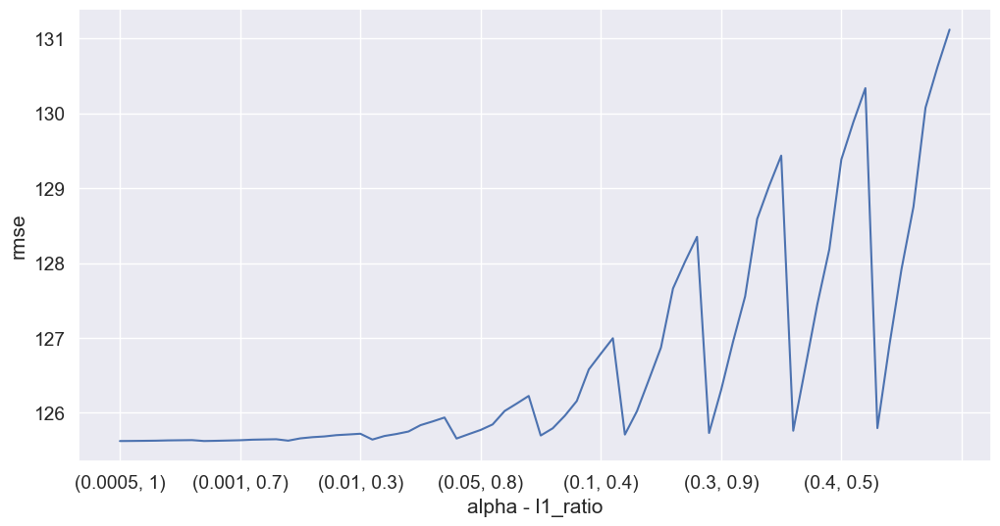

In [58]:
plt.rcParams["figure.figsize"] = (12.0, 6.0)
idx = list(product(alphas, l1_ratios))
p_cv_elastic = pd.Series(cv_elastic, index=idx)
p_cv_elastic.plot()
plt.xlabel("alpha - l1_ratio")
plt.ylabel("rmse")

In [59]:
p_cv_elastic

(0.0005, 1)      125.621394
(0.0005, 0.9)    125.622582
(0.0005, 0.8)    125.624184
(0.0005, 0.7)    125.626002
(0.0005, 0.5)    125.629832
                    ...    
(0.5, 0.8)       127.914190
(0.5, 0.7)       128.753078
(0.5, 0.5)       130.074830
(0.5, 0.4)       130.621116
(0.5, 0.3)       131.118060
Length: 70, dtype: float64

In [60]:
elastic = ElasticNet(alpha=0.0005, l1_ratio=1)

In [61]:
elastic.fit(df_train.loc[:, x_col], df_train.loc[:, y_col])

ElasticNet(alpha=0.0005, l1_ratio=1)

In [62]:
coef = pd.Series(elastic.coef_, index=df_train.loc[:, x_col].columns)

imp_coef = pd.concat([coef.sort_values().head(10), coef.sort_values().tail(10)])

Text(0.5, 1.0, 'Coefficients in the Elastic Net Model')

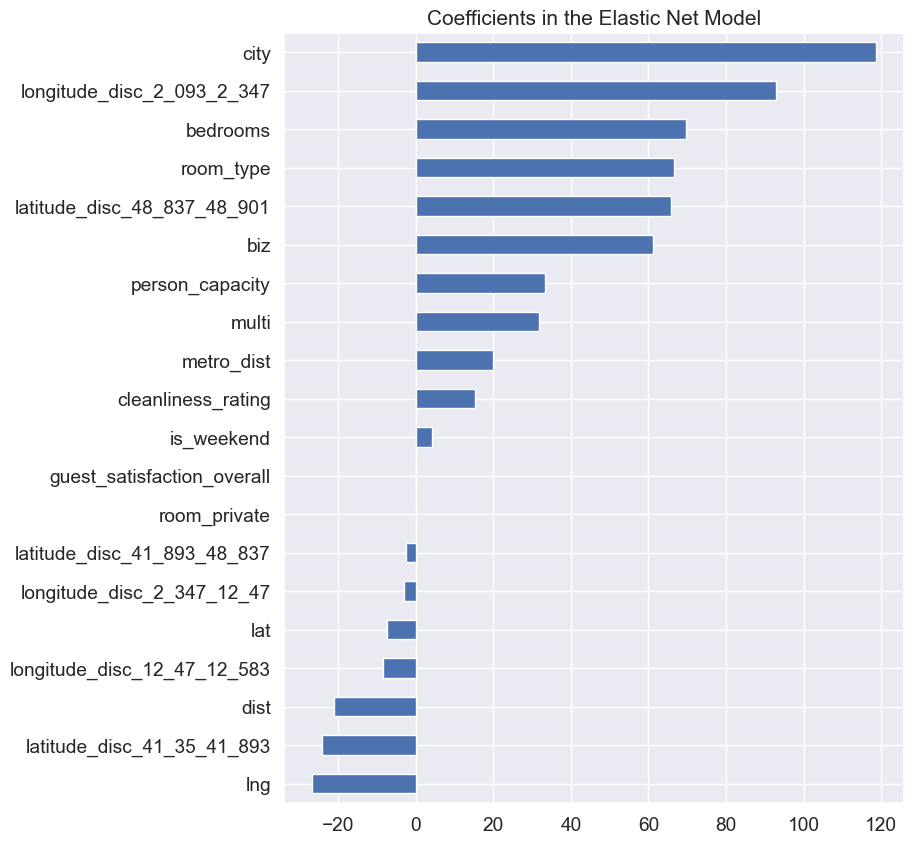

In [63]:
plt.rcParams["figure.figsize"] = (8.0, 10.0)
imp_coef.plot(kind="barh")
plt.title("Coefficients in the Elastic Net Model")

In [64]:
general_ranking = pd.merge(
    general_ranking,
    pd.DataFrame(imp_coef),
    left_index=True,
    right_index=True,
    how="left",
)

general_ranking.rename(columns={0: "EN_coef"}, inplace=True)

Boruta

Boruta is a feature selection method that identifies relevant features by iteratively removing the least important features.
It uses a Random Forest classifier to evaluate the importance of each feature.
In this context, we use Boruta to rank the features based on their importance in predicting the target variable.

In [65]:
rf = RandomForestRegressor(n_jobs=-1, max_depth=5)

feat_selector = bp(rf, n_estimators="auto", verbose=0, max_iter=100)
feat_selector.fit(df_train.loc[:, x_col].values, df_train.loc[:, y_col].values.ravel())

BorutaPy(estimator=RandomForestRegressor(max_depth=5, n_estimators=97,
                                         n_jobs=-1,
                                         random_state=RandomState(MT19937) at 0x10A226340),
         n_estimators='auto', random_state=RandomState(MT19937) at 0x10A226340)

In [66]:
feat_selector.ranking_

array([ 1,  1,  1,  6,  9,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  4,  7,
       10,  5,  3,  7])

In [67]:
boruta_DF = pd.DataFrame(index=x_col)
boruta_DF["boruta_rank"] = feat_selector.ranking_

In [68]:
general_ranking = pd.merge(
    general_ranking, boruta_DF, left_index=True, right_index=True, how="left"
)

SUMMARY OF FEATURE SELECTION

In [69]:
general_ranking.sort_values(["mi_score", "boruta_rank", "corr"], ascending=False)

,mi_score,sign_fscore,sign_fscore_0_1,corr,EN_coef,boruta_rank
lng,0.859389,0.000000e+00,1,-0.391676,-26.697237,1
lat,0.814053,0.000000e+00,1,0.376978,-7.342648,1
city,0.730737,9.967065e-273,1,-0.364870,118.697960,2
latitude_disc_48_837_48_901,0.437252,0.000000e+00,1,0.479799,65.790436,7
longitude_disc_2_093_2_347,0.381556,1.495659e-284,1,0.295820,92.785461,4
dist,0.368394,4.422992e-81,1,-0.187185,-21.108894,1
metro_dist,0.364663,4.990226e-163,1,-0.290896,19.963486,1
room_type,0.331133,0.000000e+00,1,0.460737,66.605293,1
person_capacity,0.330491,0.000000e+00,1,0.347027,33.363331,1
room_private,0.329104,0.000000e+00,1,-0.460737,-0.013505,1


In [70]:
general_ranking.to_csv("data/output/general_ranking.csv")

# Barcelona

We do similar data transformations and feature selection for the dataset for each city.

### Data Preprocessing

In [71]:
df_barcelona_train.describe()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,is_weekend
count,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000,2266.000000
mean,291.011425,1.194616,0.004413,0.809797,2.614740,0.181377,0.387026,0.321712,9.287290,90.956311,1.157988,2.101683,0.442789,462.154669,16.680920,885.660278,19.477528,2.169190,41.393475,0.450132
std,331.870733,0.406989,0.066299,0.392548,1.147157,0.385415,0.487177,0.467236,0.993127,8.719840,0.507533,1.375328,0.287695,267.290512,9.678396,467.172808,10.273739,0.019460,0.016020,0.497617
min,69.588289,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,20.000000,0.000000,0.095828,0.012994,93.820461,3.197553,159.835498,3.518471,2.093470,41.349540,0.000000
25%,161.053832,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,9.000000,88.000000,1.000000,1.066952,0.254582,284.900912,10.323950,494.501362,10.881874,2.156170,41.381222,0.000000
50%,208.299393,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,10.000000,93.000000,1.000000,1.710443,0.377337,387.103162,14.063782,813.716191,17.892438,2.170675,41.390310,0.000000
75%,329.787977,1.000000,0.000000,1.000000,3.000000,0.000000,1.000000,1.000000,10.000000,97.000000,1.000000,2.922596,0.561451,584.921203,21.376923,1221.355014,26.868698,2.179650,41.404328,1.000000
max,6943.700980,3.000000,1.000000,1.000000,6.000000,1.000000,1.000000,1.000000,10.000000,100.000000,6.000000,8.443957,4.039111,2934.133441,100.000000,4552.357526,100.000000,2.225520,41.463080,1.000000


<Axes: >

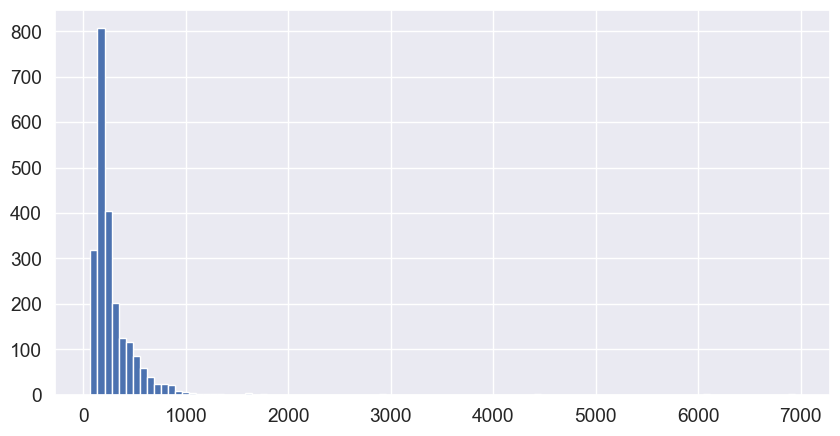

In [72]:
df_barcelona_train.realSum.hist(bins=100, figsize=(10, 5))

In [73]:
{i: df_barcelona_train.realSum.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(532.0362138385271),
 np.float64(0.91): np.float64(553.1919845462797),
 np.float64(0.92): np.float64(578.3508273791515),
 np.float64(0.93): np.float64(610.1892149789388),
 np.float64(0.9400000000000001): np.float64(632.2293853422391),
 np.float64(0.9500000000000001): np.float64(672.3764749691624),
 np.float64(0.9600000000000001): np.float64(715.2000372378801),
 np.float64(0.9700000000000001): np.float64(809.9355319198455),
 np.float64(0.9800000000000001): np.float64(862.0569274094072),
 np.float64(0.9900000000000001): np.float64(1024.774827192966)}

In [74]:
cutoff_realSum_b = df_barcelona_train.realSum.quantile(0.99)
df_barcelona_train['realSum_Cut']=df_barcelona_train['realSum'].clip(upper=cutoff_realSum_b)

In [75]:
df_barcelona_train[df_barcelona_train['realSum']>=df_barcelona_train.realSum.quantile(0.99)].shape

(23, 22)

<Axes: >

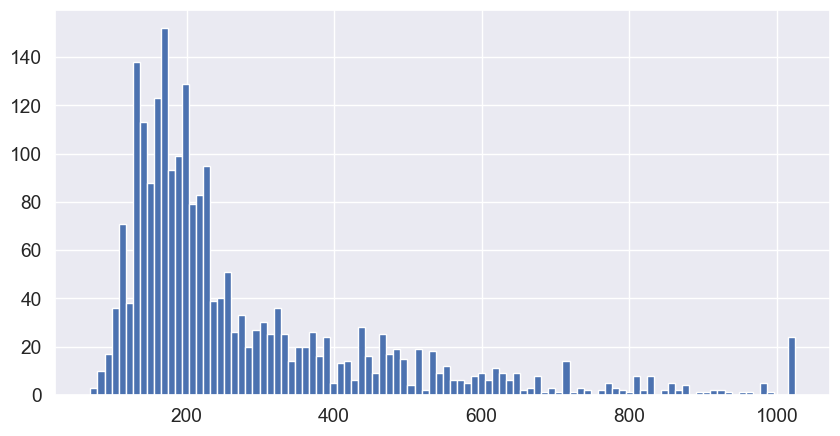

In [76]:
df_barcelona_train.realSum_Cut.hist(bins=100, figsize=(10, 5))

In [77]:
df_barcelona_train=df_barcelona_train.drop(columns=["realSum"])
df_barcelona_train=df_barcelona_train.drop(columns=["City"])

In [78]:
#Dropping out initial indices as we have standardized forms
df_barcelona_train=df_barcelona_train.drop(columns=["attr_index", 'attr_index_norm'])
df_barcelona_train=df_barcelona_train.drop(columns=["rest_index", 'rest_index_norm'])

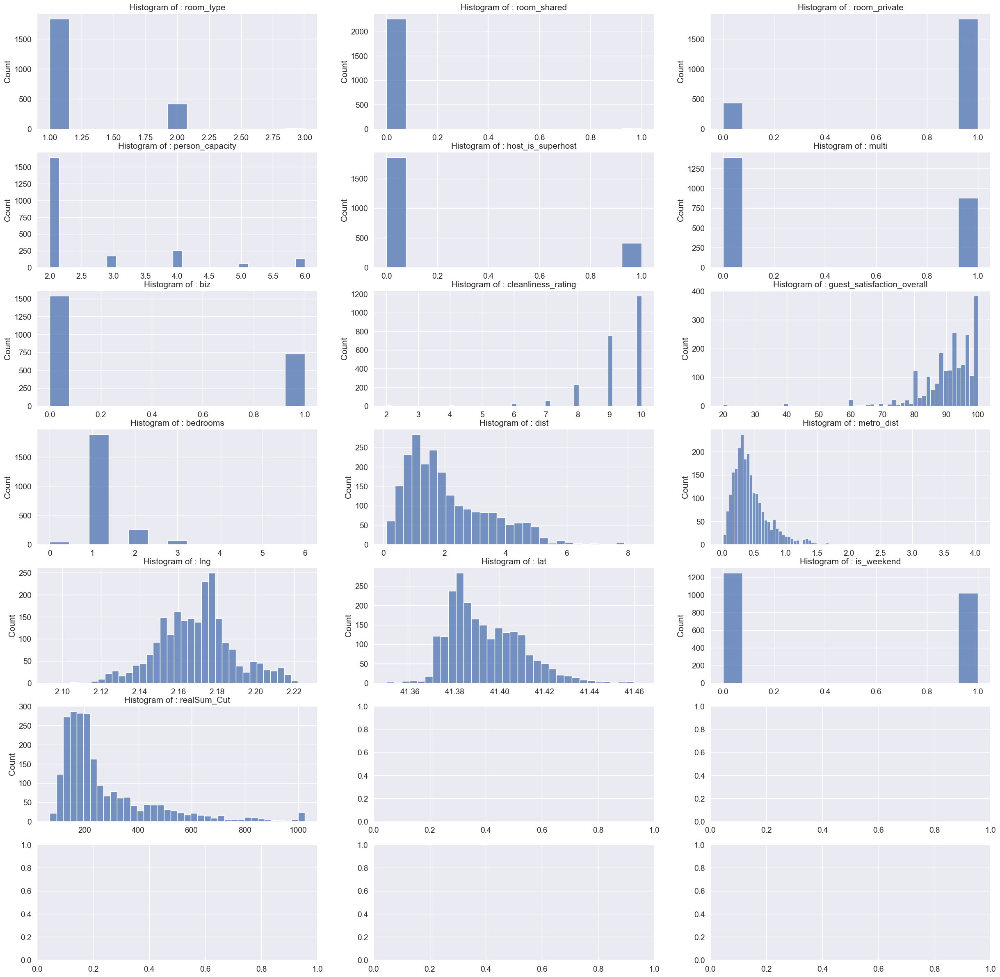

In [79]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_barcelona_train.columns, axes.flat):
    sns.histplot(x=df_barcelona_train[i], ax=ax).set(title=f"Histogram of : {i}", xlabel="")
plt.show()


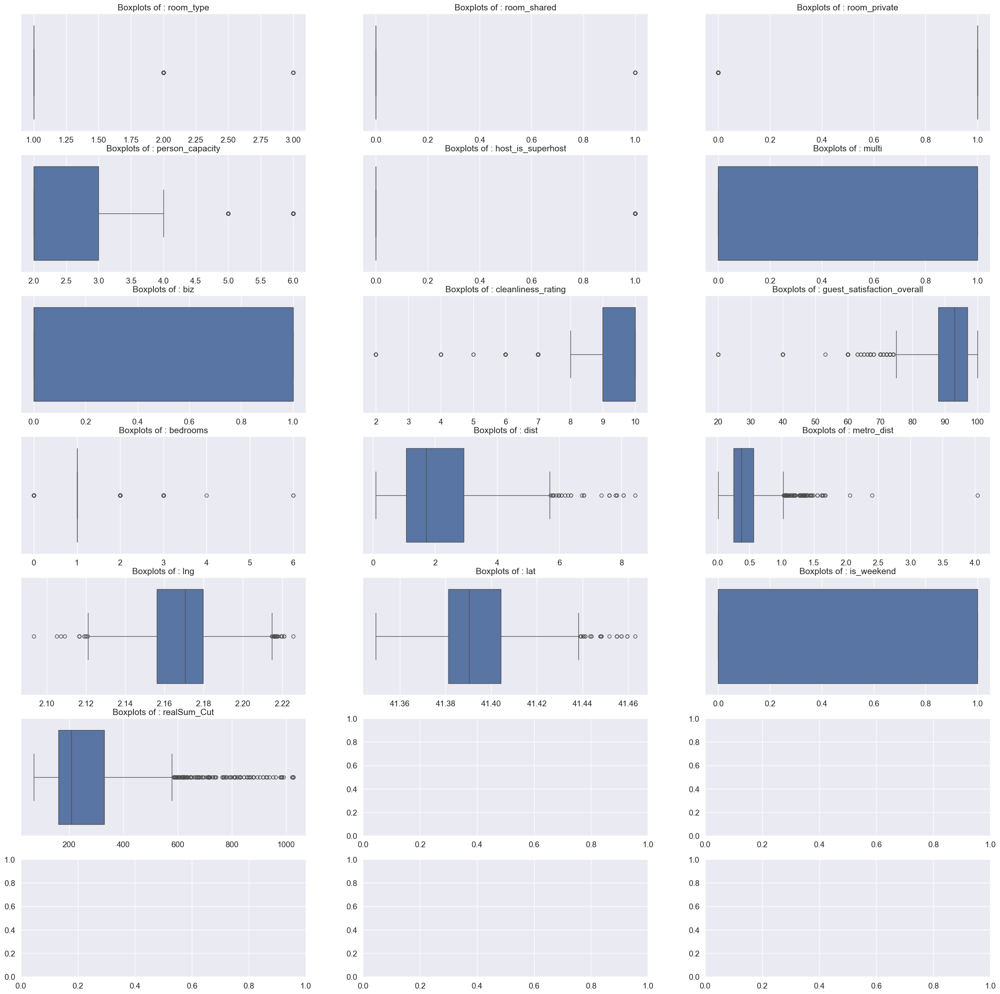

In [80]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_barcelona_train.columns, axes.flat):
    sns.boxplot(x=df_barcelona_train[i], ax=ax).set(title=f"Boxplots of : {i}", xlabel="")
plt.show()

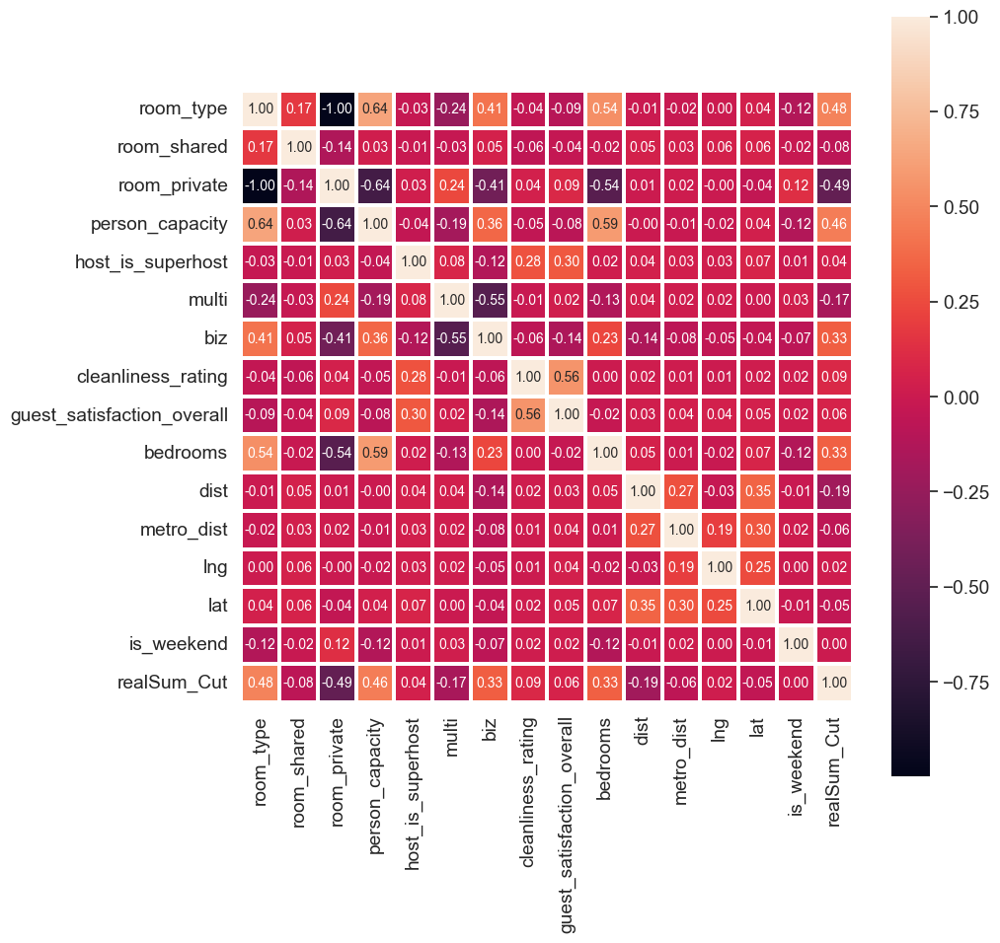

In [81]:
corr_b = df_barcelona_train.corr(method="kendall")

#Heatmap
plt.figure(figsize=(10,10))
sns.set(font_scale=1.25)
sns.heatmap(
    corr_b, linewidths=1.5, annot=True, square=True, fmt=".2f", annot_kws={"size": 10}
)
plt.show()

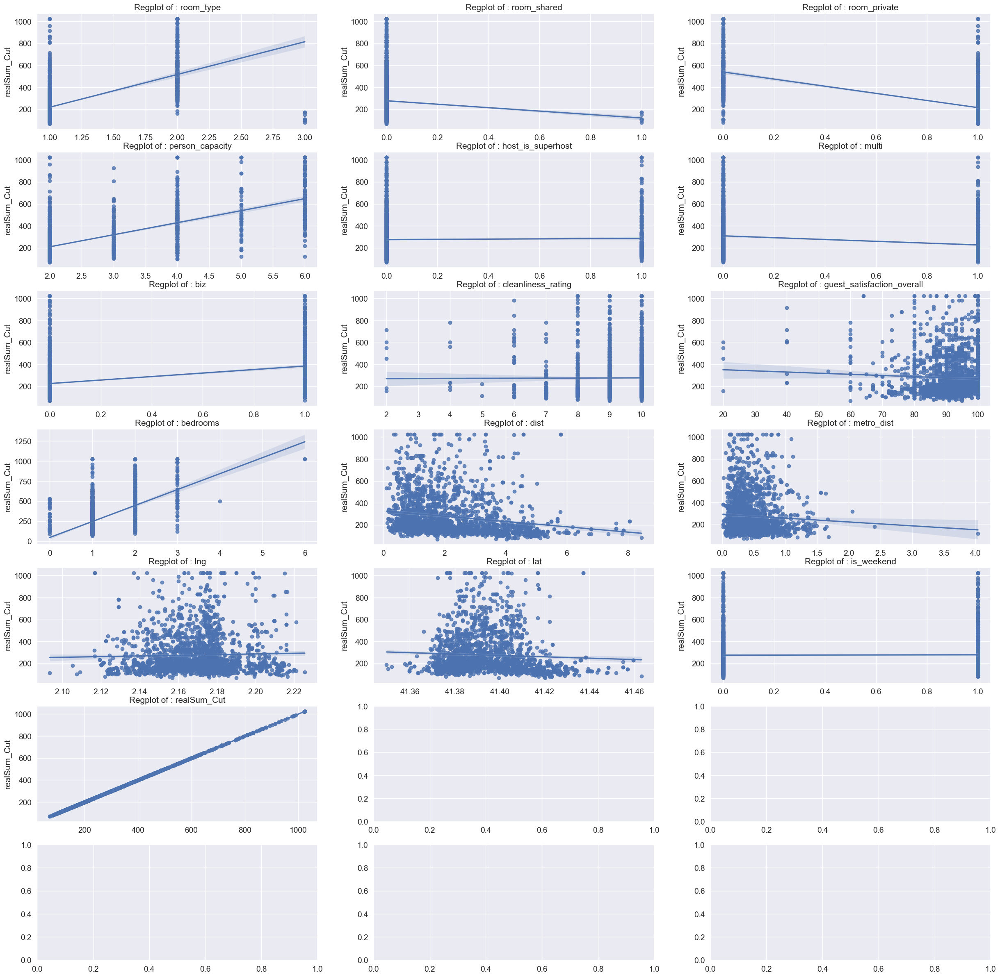

In [82]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_barcelona_train.columns, axes.flat):
    sns.regplot(x=df_barcelona_train[i], y=df_barcelona_train["realSum_Cut"], ax=ax).set(title=f"Regplot of : {i}", xlabel="")
plt.show()

In [83]:
import plotly.express as px

In [84]:
fig = px.density_mapbox(df_barcelona_train, lat="lat", lon="lng", z="realSum_Cut", center = dict(lat= 41.39, lon=2.15), radius = 12, zoom = 12, mapbox_style = 'open-street-map', opacity=0.5, width=1000, height=800, title="Density of AirBnb offers in Barcelona")
fig.show()

Categorical Variables

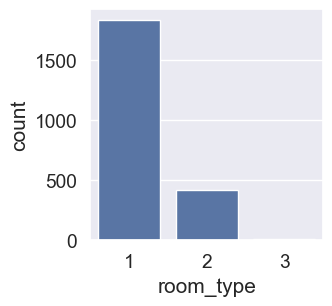

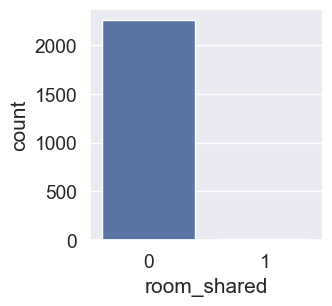

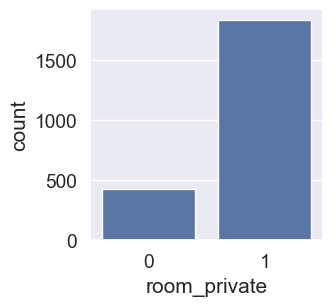

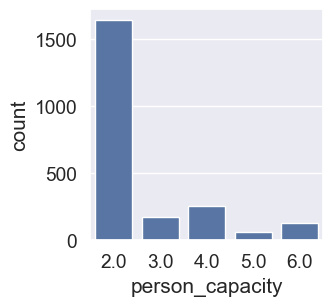

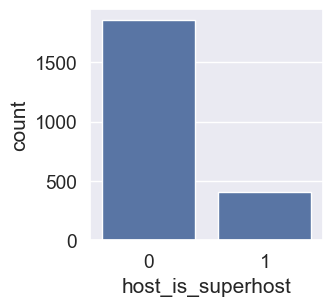

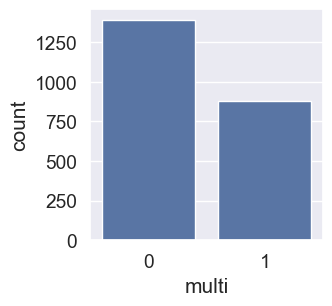

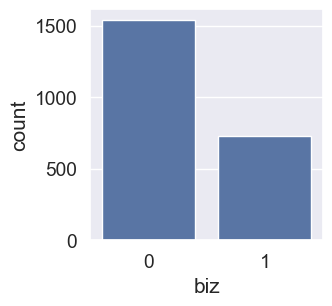

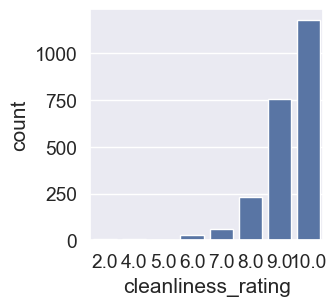

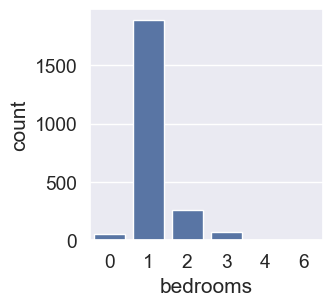

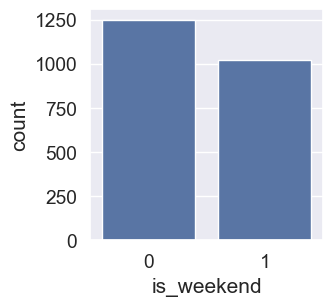

In [85]:
#Plots for categorical variables
Col_b= ['room_type', 'room_shared','room_private','person_capacity','host_is_superhost','multi', 'biz', 'cleanliness_rating', 'bedrooms', 'is_weekend']
for col in Col_b:
    plt.figure(figsize=(3,3))
    sns.countplot(x=col, data=df_barcelona_train)
    plt.show()

In [86]:
df_barcelona_train.bedrooms.describe()

count    2266.000000
mean        1.157988
std         0.507533
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         6.000000
Name: bedrooms, dtype: float64

In [87]:
{i: df_barcelona_train.bedrooms.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(2.0),
 np.float64(0.91): np.float64(2.0),
 np.float64(0.92): np.float64(2.0),
 np.float64(0.93): np.float64(2.0),
 np.float64(0.9400000000000001): np.float64(2.0),
 np.float64(0.9500000000000001): np.float64(2.0),
 np.float64(0.9600000000000001): np.float64(2.0),
 np.float64(0.9700000000000001): np.float64(3.0),
 np.float64(0.9800000000000001): np.float64(3.0),
 np.float64(0.9900000000000001): np.float64(3.0)}

In [88]:
cutoff_bedrooms_b = df_barcelona_train.bedrooms.quantile(0.99)
df_barcelona_train['bedrooms']=df_barcelona_train['bedrooms'].clip(upper=cutoff_bedrooms_b)

In [89]:
df_barcelona_train.cleanliness_rating.describe()

count    2266.000000
mean        9.287290
std         0.993127
min         2.000000
25%         9.000000
50%        10.000000
75%        10.000000
max        10.000000
Name: cleanliness_rating, dtype: float64

In [90]:
{i: df_barcelona_train.cleanliness_rating.quantile(i) for i in np.arange(0.0, 0.1, 0.01)}

{np.float64(0.0): np.float64(2.0),
 np.float64(0.01): np.float64(6.0),
 np.float64(0.02): np.float64(7.0),
 np.float64(0.03): np.float64(7.0),
 np.float64(0.04): np.float64(7.0),
 np.float64(0.05): np.float64(8.0),
 np.float64(0.06): np.float64(8.0),
 np.float64(0.07): np.float64(8.0),
 np.float64(0.08): np.float64(8.0),
 np.float64(0.09): np.float64(8.0)}

In [91]:
cutoff_cleanliness_rating_b = df_barcelona_train.cleanliness_rating.quantile(0.01)
df_barcelona_train['cleanliness_rating']=df_barcelona_train['cleanliness_rating'].clip(lower=cutoff_cleanliness_rating_b)

In [92]:
df_barcelona_train=df_barcelona_train.drop(columns=["room_shared"])

In [93]:
#room_type: Let's drop out "other" (3) category (we will incorporate it with 2 category)
df_barcelona_train['room_type']=df_barcelona_train['room_type'].clip(upper=2)

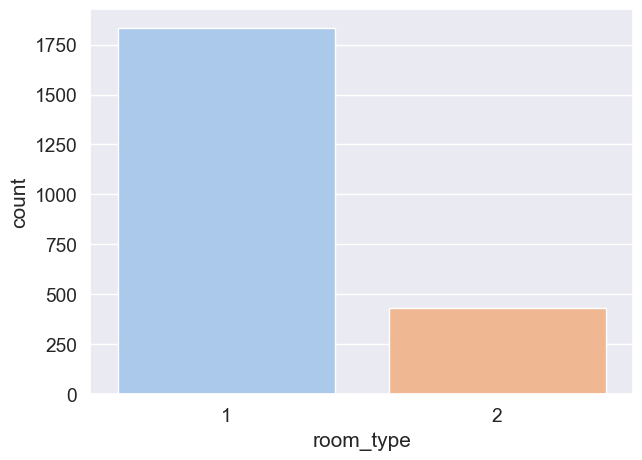

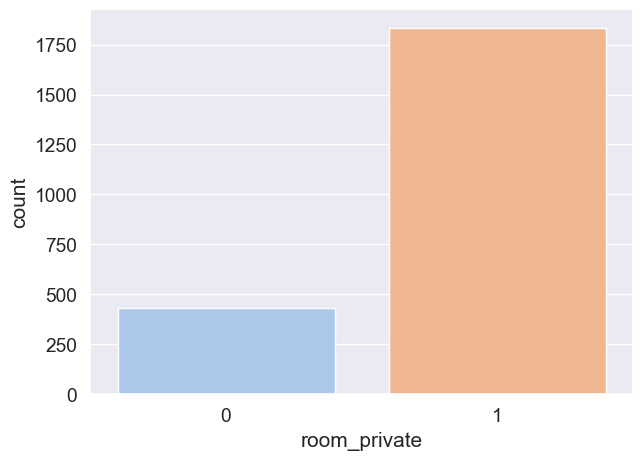

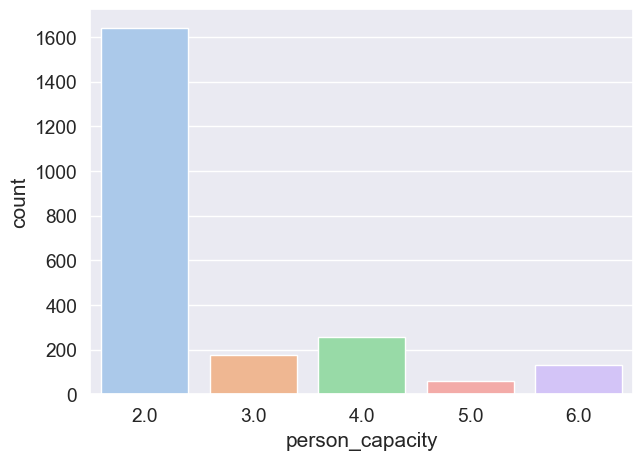

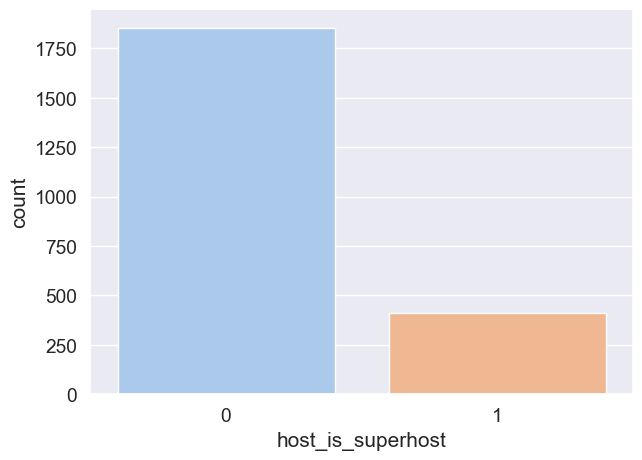

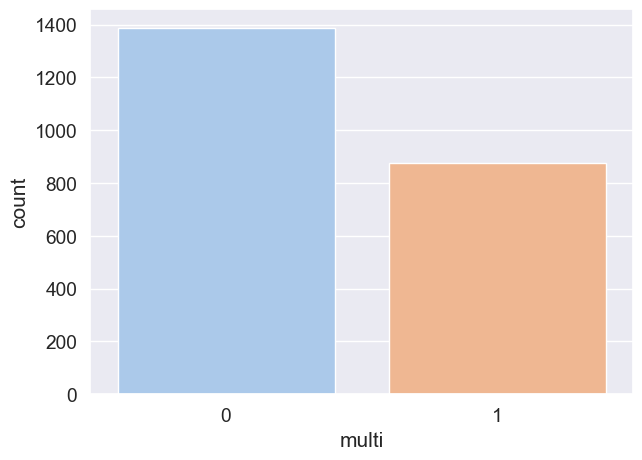

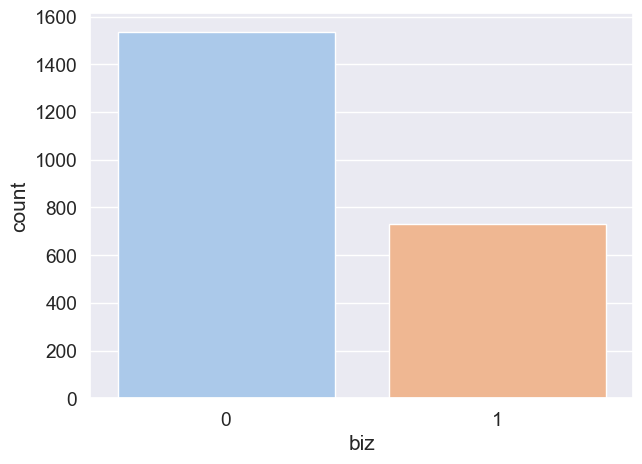

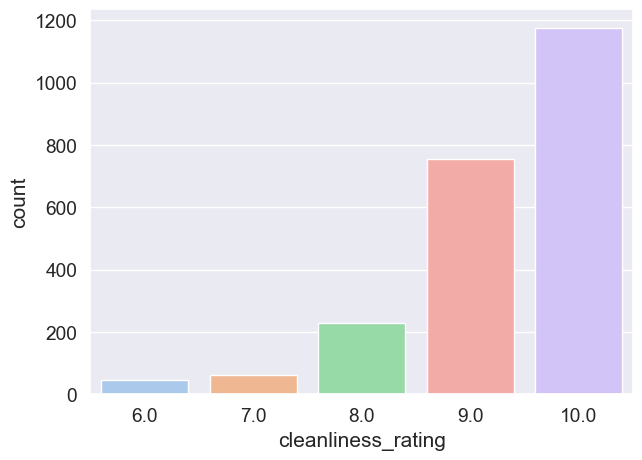

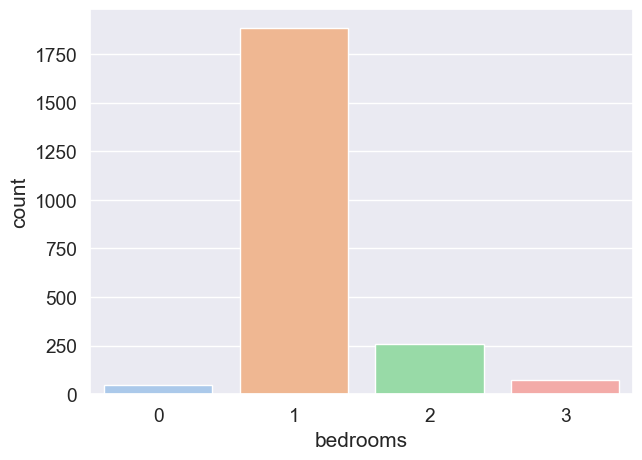

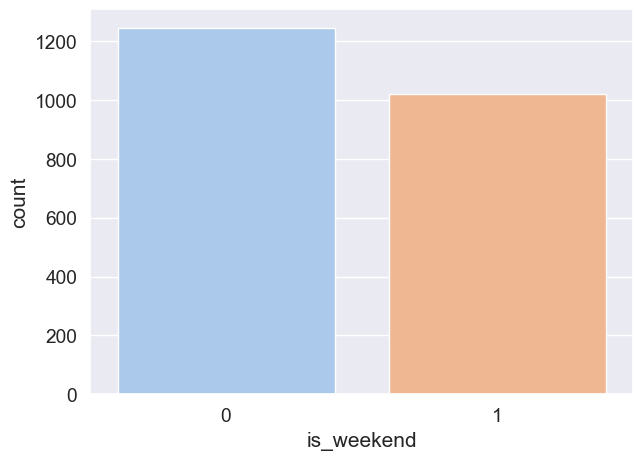

In [94]:
#Plots after categorical changes
Col_b= ['room_type','room_private','person_capacity','host_is_superhost','multi', 'biz', 'cleanliness_rating', 'bedrooms', 'is_weekend' ]
for col in Col_b:
    plt.figure(figsize=(7,5))
    sns.countplot(x=col,data=df_barcelona_train, palette="pastel")
    plt.show()

Continuous Variables

In [95]:
_, longitude_bins_b = pd.qcut(df_barcelona_train.lng, q=3, retbins=True) #pretty decent match
longitude_bins_b

df_barcelona_train["Longitude_disc"] = pd.cut(df_barcelona_train.lng, longitude_bins_b)

df_barcelona_train = pd.get_dummies(df_barcelona_train, columns=["Longitude_disc"], drop_first=False)


_, latitude_bins_b = pd.qcut(df_barcelona_train.lng, q=3, retbins=True) #pretty decent match
latitude_bins_b

df_barcelona_train["Latitude_disc"] = pd.cut(df_barcelona_train.lng, latitude_bins_b)

df_barcelona_train = pd.get_dummies(df_barcelona_train, columns=["Latitude_disc"], drop_first=False)

In [96]:
df_barcelona_train.sample(20)

,room_type,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,...,lng,lat,is_weekend,realSum_Cut,"Longitude_disc_(2.093, 2.161]","Longitude_disc_(2.161, 2.177]","Longitude_disc_(2.177, 2.226]","Latitude_disc_(2.093, 2.161]","Latitude_disc_(2.161, 2.177]","Latitude_disc_(2.177, 2.226]"
1622,1,1,2.0,0,0,0,10.0,100.0,1,0.470117,...,2.17534,41.38849,1,161.984779,False,True,False,False,True,False
1183,2,0,5.0,0,0,1,9.0,81.0,2,2.948608,...,2.14822,41.40802,0,439.872460,True,False,False,True,False,False
2655,1,1,2.0,0,0,0,9.0,96.0,2,7.857795,...,2.18515,41.45699,1,149.416994,False,False,True,False,False,True
1143,1,1,2.0,1,1,0,10.0,94.0,1,2.651498,...,2.16777,41.41096,0,141.038471,False,True,False,False,True,False
1766,1,1,2.0,0,0,0,9.0,93.0,1,1.241717,...,2.16796,41.37606,1,150.580678,False,True,False,False,True,False
1650,1,1,2.0,0,1,0,10.0,95.0,1,1.106366,...,2.17866,41.39468,1,213.885075,False,False,True,False,False,True
177,1,1,2.0,0,1,0,9.0,87.0,1,1.718970,...,2.16187,41.37292,0,125.212372,False,True,False,False,True,False
2232,1,1,2.0,0,1,0,6.0,80.0,1,0.647105,...,2.17570,41.39109,1,167.803198,False,True,False,False,True,False
1827,1,1,2.0,1,0,0,10.0,98.0,1,2.140295,...,2.18980,41.37491,1,220.867177,False,False,True,False,False,True
1626,1,1,2.0,0,0,0,9.0,93.0,1,1.218102,...,2.18399,41.39023,1,173.621617,False,False,True,False,False,True


Data Cleaning

In [97]:
df_barcelona_train = downcast_dataframe(df_barcelona_train)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 2266 entries, 1746 to 1346
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   room_type                      2266 non-null   int64  
 1   room_private                   2266 non-null   int64  
 2   person_capacity                2266 non-null   float64
 3   host_is_superhost              2266 non-null   int64  
 4   multi                          2266 non-null   int64  
 5   biz                            2266 non-null   int64  
 6   cleanliness_rating             2266 non-null   float64
 7   guest_satisfaction_overall     2266 non-null   float64
 8   bedrooms                       2266 non-null   int64  
 9   dist                           2266 non-null   float64
 10  metro_dist                     2266 non-null   float64
 11  lng                            2266 non-null   float64
 12  lat                            226

In [98]:
def transformations(df_test, longitude_bins, latitude_bins):
    df_test["is_weekend"] = df_test["is_weekend"].astype(int)
    df_test["room_shared"] = df_test["room_shared"].astype(int)
    df_test["room_private"] = df_test["room_private"].astype(int)
    df_test["host_is_superhost"] = df_test["host_is_superhost"].astype(int)
    df_test['room_type'] = df_test['room_type'].map({'Private room': 1, 'Entire home/apt': 2}).fillna(2)
    df_test["room_type"] = df_test["room_type"].astype(int)
    cutoff_realSum = df_test.realSum.quantile(0.99)
    df_test['realSum_Cut'] = df_test['realSum'].clip(upper=cutoff_realSum)
    cutoff_bedrooms = df_test.bedrooms.quantile(0.99)
    df_test['bedrooms'] = df_test['bedrooms'].clip(upper=cutoff_bedrooms)
    cutoff_cleanliness_rating = df_test.cleanliness_rating.quantile(0.01)
    df_test['cleanliness_rating'] = df_test['cleanliness_rating'].clip(lower=cutoff_cleanliness_rating)
    df_test = df_test.drop(columns=["room_shared", "attr_index", "rest_index", "realSum", "City"])
    df_test["Longitude_disc"] = pd.cut(df_test.lng, longitude_bins)
    df_test = pd.get_dummies(df_test, columns=["Longitude_disc"], drop_first=False)
    df_test["Latitude_disc"] = pd.cut(df_test.lat, latitude_bins)
    df_test = pd.get_dummies(df_test, columns=["Latitude_disc"], drop_first=False)
    df_test = downcast_dataframe(df_test)
    return df_test

In [99]:
#application of all transformations to out-of-sample dataset
df_barcelona_test = transformations(df_barcelona_test, longitude_bins_b, latitude_bins_b)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 567 entries, 1207 to 2625
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   room_type                      567 non-null    int64  
 1   room_private                   567 non-null    int64  
 2   person_capacity                567 non-null    float64
 3   host_is_superhost              567 non-null    int64  
 4   multi                          567 non-null    int64  
 5   biz                            567 non-null    int64  
 6   cleanliness_rating             567 non-null    float64
 7   guest_satisfaction_overall     567 non-null    float64
 8   bedrooms                       567 non-null    int64  
 9   dist                           567 non-null    float64
 10  metro_dist                     567 non-null    float64
 11  attr_index_norm                567 non-null    float64
 12  rest_index_norm                567 

In [100]:
df_barcelona_train.columns = clear_names(df_barcelona_train.columns)
df_barcelona_test.columns = clear_names(df_barcelona_test.columns)

In [101]:
df_barcelona_train.to_csv("data/output/data_barcelona_train.csv", index=False)
df_barcelona_test.to_csv("data/output/data_barcelona_test.csv", index=False)

Feature Selection

In [102]:
general_ranking_barcelona= feature_selection(df_barcelona_train, "realsum_cut")

Elastic Net

Text(0, 0.5, 'rmse')

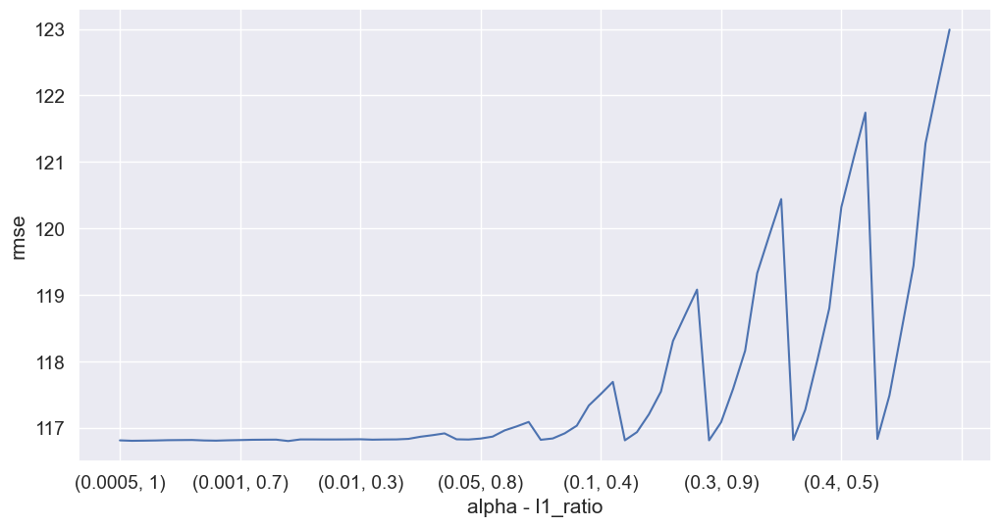

In [103]:
x_col_b = df_barcelona_train.columns.tolist()
x_col_b.remove(y_col)

cv_elastic_b = [
    rmse_cv(ElasticNet(alpha=alpha, l1_ratio=l1_ratio), df_barcelona_train, x_col_b, y_col).mean()
    for (alpha, l1_ratio) in product(alphas, l1_ratios)
]

plt.rcParams["figure.figsize"] = (12.0, 6.0)
idx = list(product(alphas, l1_ratios))
p_cv_elastic_b = pd.Series(cv_elastic_b, index=idx)
p_cv_elastic_b.plot()
plt.xlabel("alpha - l1_ratio")
plt.ylabel("rmse")

In [104]:
p_cv_elastic_b

(0.0005, 1)      116.809297
(0.0005, 0.9)    116.802965
(0.0005, 0.8)    116.804987
(0.0005, 0.7)    116.807741
(0.0005, 0.5)    116.812186
                    ...    
(0.5, 0.8)       118.459894
(0.5, 0.7)       119.438882
(0.5, 0.5)       121.279163
(0.5, 0.4)       122.147760
(0.5, 0.3)       122.990974
Length: 70, dtype: float64

In [105]:
elastic_b = ElasticNet(alpha=0.0005, l1_ratio=1)
elastic_b.fit(df_barcelona_train.loc[:, x_col_b], df_barcelona_train.loc[:, y_col])

ElasticNet(alpha=0.0005, l1_ratio=1)

In [106]:
coef_b = pd.Series(elastic_b.coef_, index=df_barcelona_train.loc[:, x_col_b].columns)
imp_coef_b = pd.concat([coef_b.sort_values().head(10), coef_b.sort_values().tail(10)])
imp_coef_b

dist                          -18.583822
longitude_disc_2_093_2_161    -13.907234
longitude_disc_2_177_2_226    -10.743725
latitude_disc_2_161_2_177      -7.129308
latitude_disc_2_177_2_226      -7.030373
latitude_disc_2_093_2_161      -6.819397
metro_dist                     -3.864239
longitude_disc_2_161_2_177     -2.360851
multi                          -0.567030
room_private                   -0.006800
guest_satisfaction_overall      0.570122
cleanliness_rating              8.392040
lat                            17.253742
host_is_superhost              22.136229
biz                            37.729160
bedrooms                       43.658993
is_weekend                     44.004436
person_capacity                51.055099
room_type                     176.039307
lng                           407.056030
dtype: float32

In [107]:
general_ranking_barcelona = pd.merge(
    general_ranking_barcelona,
    pd.DataFrame(imp_coef_b),
    left_index=True,
    right_index=True,
    how="left",
)
general_ranking_barcelona.rename(columns={0: "EN_coef"}, inplace=True)

Boruta

In [108]:
rf = RandomForestRegressor(n_jobs=-1, max_depth=5)
feat_selector = bp(rf, n_estimators="auto", verbose=0, max_iter=100)
feat_selector.fit(df_barcelona_train.loc[:, x_col_b].values, df_barcelona_train.loc[:, y_col].values.ravel())

boruta_DF = pd.DataFrame(index=x_col_b)
boruta_DF["boruta_rank"] = feat_selector.ranking_
general_ranking_barcelona = pd.merge(
    general_ranking_barcelona, boruta_DF, left_index=True, right_index=True, how="left"
)

# Paris

In [109]:
### Data Preprocessing

In [110]:
df_paris_train.describe()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,is_weekend
count,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000
mean,391.995622,1.783925,0.013832,0.229907,2.963738,0.139065,0.220561,0.244299,9.264673,92.059813,0.975888,2.978022,0.227158,373.771332,18.184130,819.283436,42.600635,2.343565,48.864405,0.533084
std,344.740669,0.443945,0.116803,0.420812,1.227144,0.346047,0.414664,0.429711,0.959180,8.644415,0.643632,1.452477,0.123144,159.489877,7.759021,283.204417,15.649567,0.033477,0.017389,0.498951
min,92.739305,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,20.000000,0.000000,0.071566,0.003220,116.297506,5.654976,258.674400,11.933258,2.247880,48.819940,0.000000
25%,240.003728,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,9.000000,89.000000,1.000000,1.829659,0.141794,262.212730,12.755784,596.098136,30.263088,2.323605,48.852140,0.000000
50%,315.733060,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,9.000000,94.000000,1.000000,2.960261,0.207325,337.898338,16.434610,771.653805,40.325052,2.346910,48.866120,1.000000
75%,461.133377,2.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,10.000000,98.000000,1.000000,4.026641,0.290444,456.150205,22.184681,1033.160355,53.100668,2.367590,48.877918,1.000000
max,16445.614689,3.000000,1.000000,1.000000,6.000000,1.000000,1.000000,1.000000,10.000000,100.000000,5.000000,7.703737,1.154771,2056.552199,100.000000,2167.677121,100.000000,2.438590,48.901060,1.000000


<Axes: >

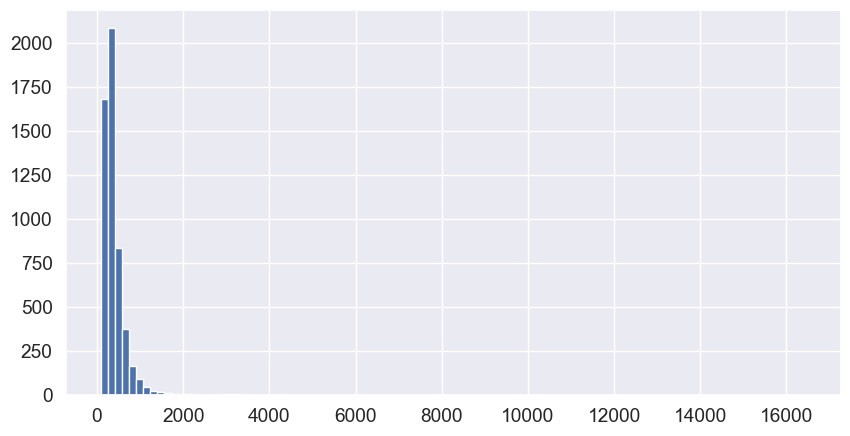

In [111]:
df_paris_train.realSum.hist(bins=100, figsize=(10, 5))

In [112]:
{i: df_paris_train.realSum.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(660.8957032342253),
 np.float64(0.91): np.float64(684.3601454003169),
 np.float64(0.92): np.float64(706.962438251468),
 np.float64(0.93): np.float64(744.5102059837826),
 np.float64(0.9400000000000001): np.float64(776.6334234318203),
 np.float64(0.9500000000000001): np.float64(822.7700624475721),
 np.float64(0.9600000000000001): np.float64(899.0306645540139),
 np.float64(0.9700000000000001): np.float64(968.403392674061),
 np.float64(0.9800000000000001): np.float64(1112.8110727933677),
 np.float64(0.9900000000000001): np.float64(1359.3461646006167)}

In [113]:
cutoff_realSum_b = df_paris_train.realSum.quantile(0.99)
df_paris_train['realSum_Cut'] = df_paris_train['realSum'].clip(upper=cutoff_realSum_b)

In [114]:
df_paris_train[df_paris_train['realSum'] >= df_paris_train.realSum.quantile(0.99)].shape

(54, 22)

<Axes: >

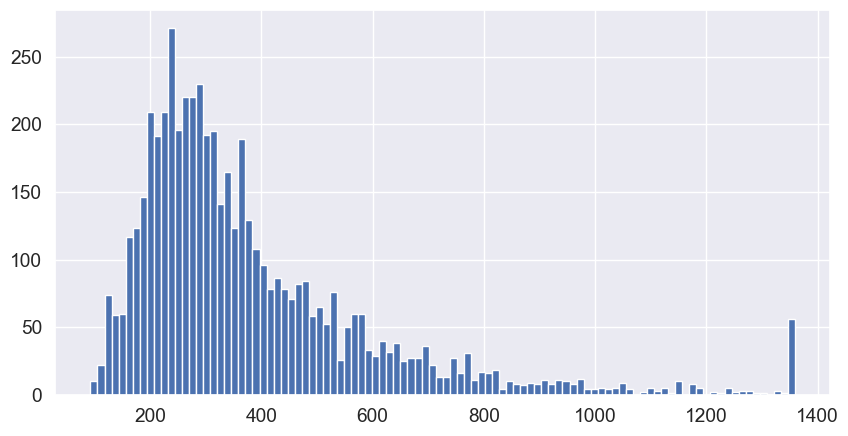

In [115]:
df_paris_train.realSum_Cut.hist(bins=100, figsize=(10, 5))

In [116]:
df_paris_train=df_paris_train.drop(columns=["realSum"])
df_paris_train = df_paris_train.drop(columns=["City"])

In [117]:
#Dropping out initial indices as we have standardized forms
df_paris_train=df_paris_train.drop(columns=["attr_index", 'attr_index_norm'])
df_paris_train=df_paris_train.drop(columns=["rest_index", 'rest_index_norm'])

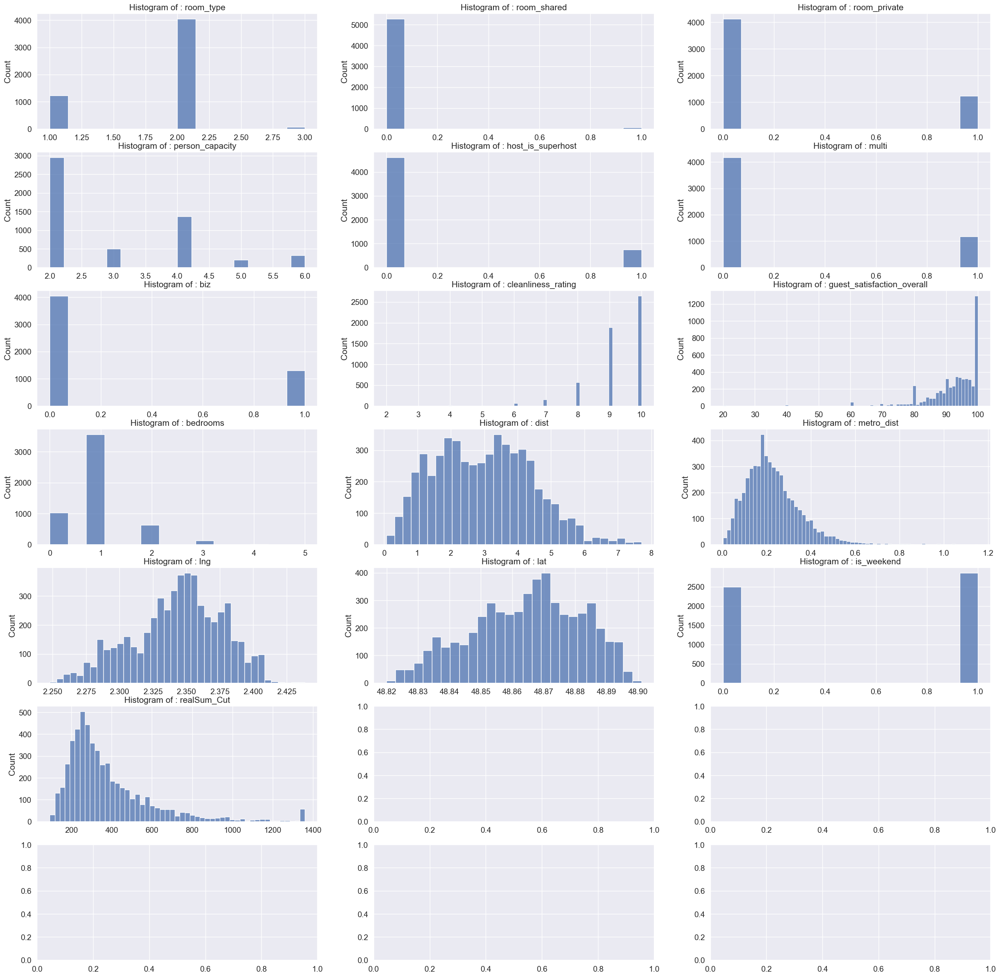

In [118]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_paris_train.columns, axes.flat):
    sns.histplot(x=df_paris_train[i], ax=ax).set(title=f"Histogram of : {i}", xlabel="")
plt.show()

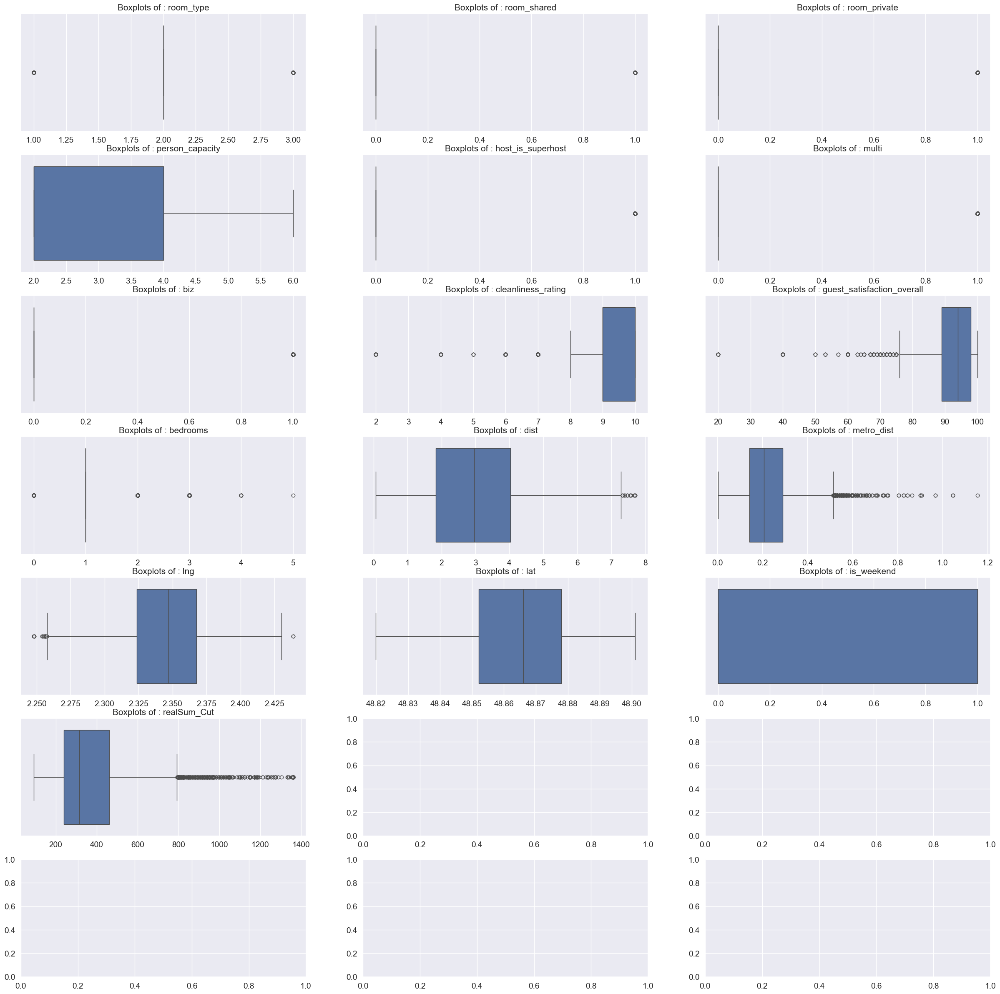

In [119]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_paris_train.columns, axes.flat):
    sns.boxplot(x=df_paris_train[i], ax=ax).set(title=f"Boxplots of : {i}", xlabel="")
plt.show()

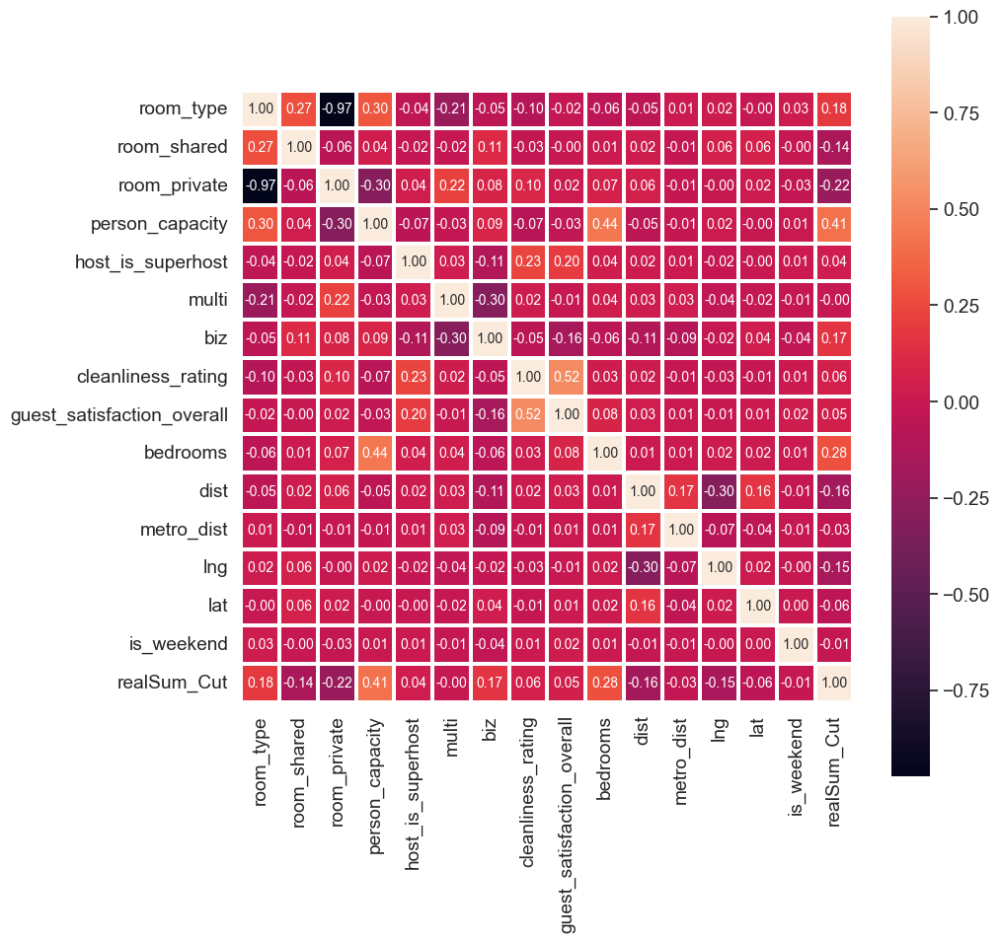

In [120]:
corr_b = df_paris_train.corr(method="kendall")

#Heatmap
plt.figure(figsize=(10, 10))
sns.set(font_scale=1.25)
sns.heatmap(
    corr_b, linewidths=1.5, annot=True, square=True, fmt=".2f", annot_kws={"size": 10}
)
plt.show()

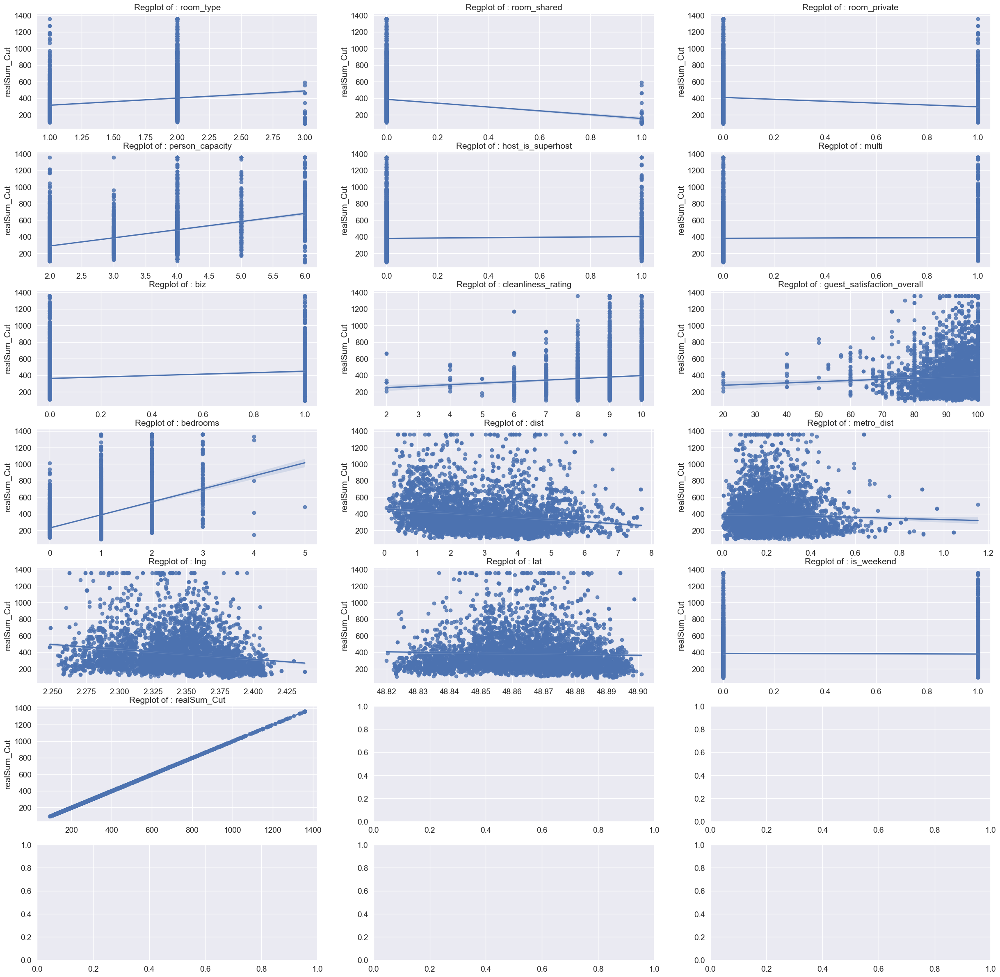

In [121]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_paris_train.columns, axes.flat):
    sns.regplot(x=df_paris_train[i], y=df_paris_train["realSum_Cut"], ax=ax).set(title=f"Regplot of : {i}",
                                                                                         xlabel="")
plt.show()

In [122]:
import plotly.express as px

fig = px.density_mapbox(df_paris_train, lat="lat", lon="lng", z="realSum_Cut",
                        radius=12, zoom=11, mapbox_style='open-street-map', opacity=0.5, width=1000, height=800,
                        title="Density of AirBnb offers in paris")
fig.show()

Categorical Variables

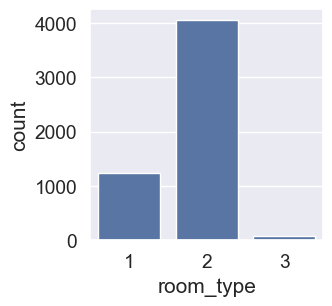

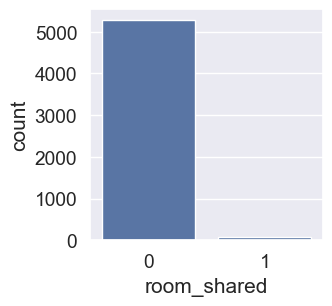

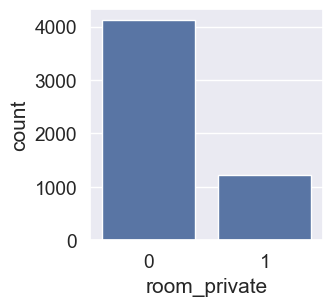

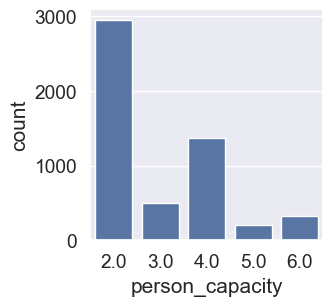

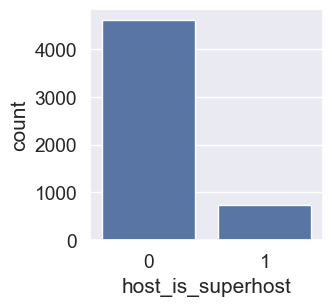

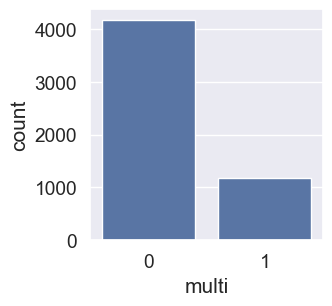

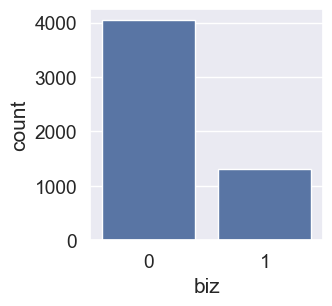

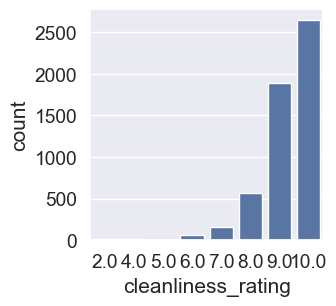

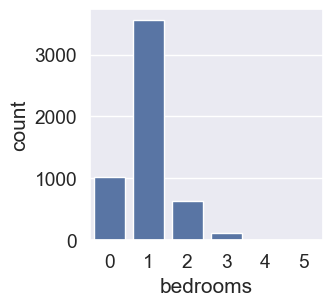

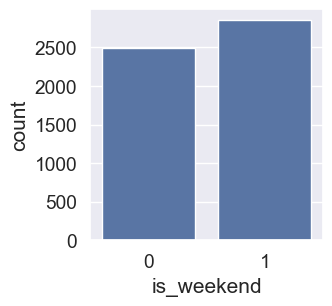

In [125]:
Col_b = ['room_type', 'room_shared', 'room_private', 'person_capacity', 'host_is_superhost', 'multi', 'biz',
         'cleanliness_rating', 'bedrooms', 'is_weekend']
for col in Col_b:
    plt.figure(figsize=(3, 3))
    sns.countplot(x=col, data=df_paris_train)
    plt.show()

In [126]:
df_paris_train.bedrooms.describe()

count    5350.000000
mean        0.975888
std         0.643632
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         5.000000
Name: bedrooms, dtype: float64

In [127]:
{i: df_paris_train.bedrooms.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(2.0),
 np.float64(0.91): np.float64(2.0),
 np.float64(0.92): np.float64(2.0),
 np.float64(0.93): np.float64(2.0),
 np.float64(0.9400000000000001): np.float64(2.0),
 np.float64(0.9500000000000001): np.float64(2.0),
 np.float64(0.9600000000000001): np.float64(2.0),
 np.float64(0.9700000000000001): np.float64(2.0),
 np.float64(0.9800000000000001): np.float64(3.0),
 np.float64(0.9900000000000001): np.float64(3.0)}

In [128]:
cutoff_bedrooms_b = df_paris_train.bedrooms.quantile(0.99)
df_paris_train['bedrooms'] = df_paris_train['bedrooms'].clip(upper=cutoff_bedrooms_b)

In [129]:
df_paris_train.cleanliness_rating.describe()

count    5350.000000
mean        9.264673
std         0.959180
min         2.000000
25%         9.000000
50%         9.000000
75%        10.000000
max        10.000000
Name: cleanliness_rating, dtype: float64

In [130]:
{i: df_paris_train.cleanliness_rating.quantile(i) for i in np.arange(0.0, 0.1, 0.01)}

{np.float64(0.0): np.float64(2.0),
 np.float64(0.01): np.float64(6.0),
 np.float64(0.02): np.float64(7.0),
 np.float64(0.03): np.float64(7.0),
 np.float64(0.04): np.float64(7.0),
 np.float64(0.05): np.float64(8.0),
 np.float64(0.06): np.float64(8.0),
 np.float64(0.07): np.float64(8.0),
 np.float64(0.08): np.float64(8.0),
 np.float64(0.09): np.float64(8.0)}

In [131]:
cutoff_cleanliness_rating_b = df_paris_train.cleanliness_rating.quantile(0.01)

In [132]:
df_paris_train['cleanliness_rating'] = df_paris_train['cleanliness_rating'].clip(
    lower=cutoff_cleanliness_rating_b)

In [133]:
df_paris_train = df_paris_train.drop(columns=["room_shared"])

In [134]:
#room_type: Let's drop out "other" (3) category (we will incorporate it with 2 category)
df_paris_train['room_type'] = df_paris_train['room_type'].clip(upper=2)

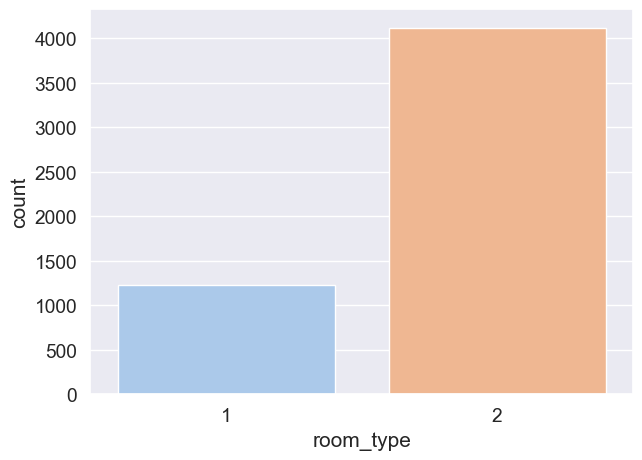

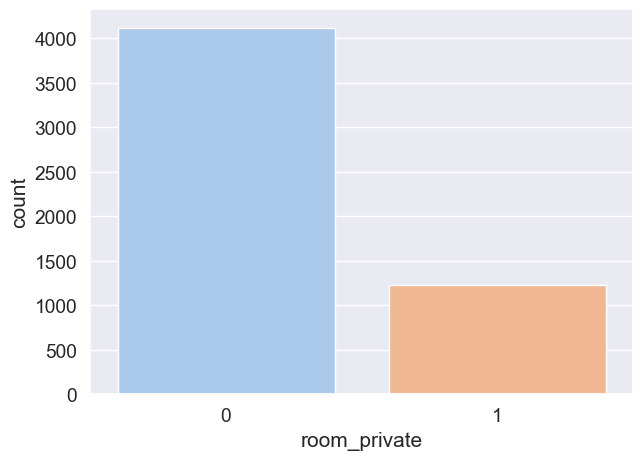

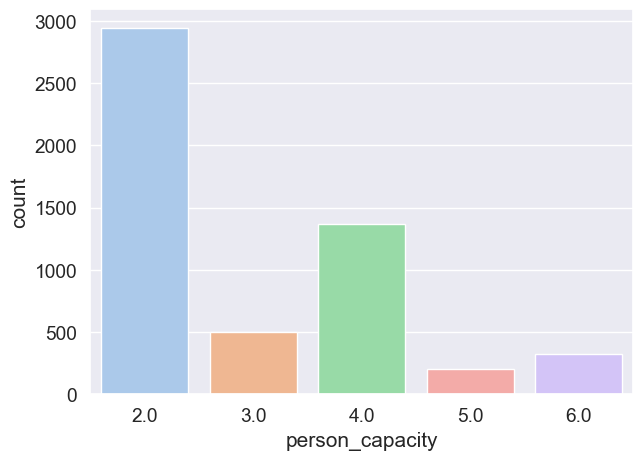

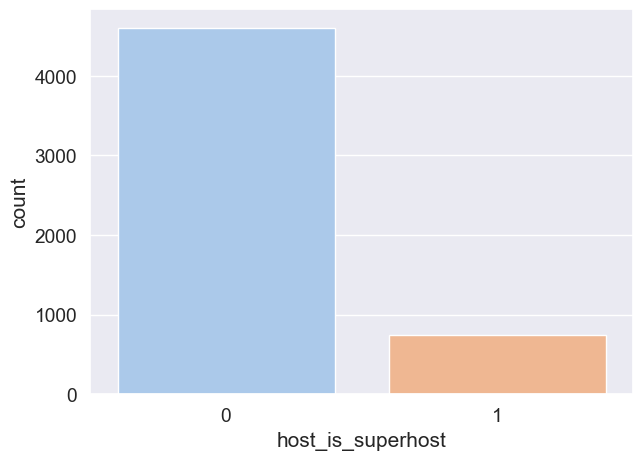

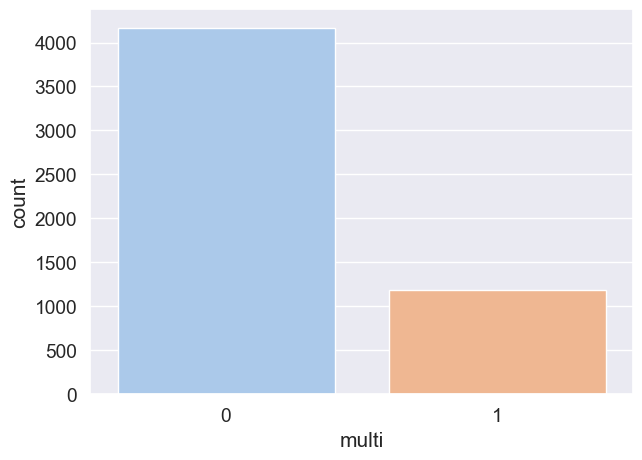

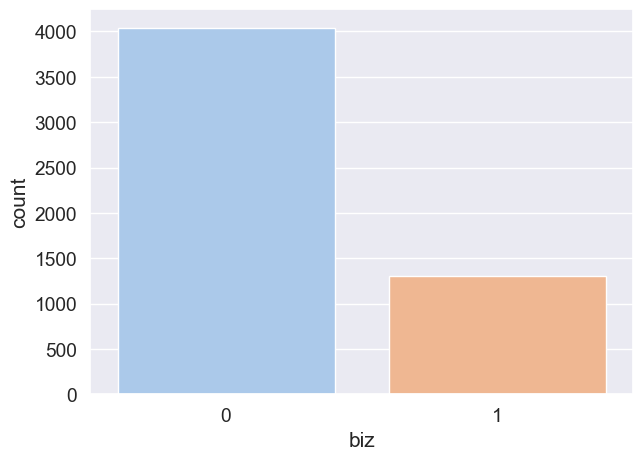

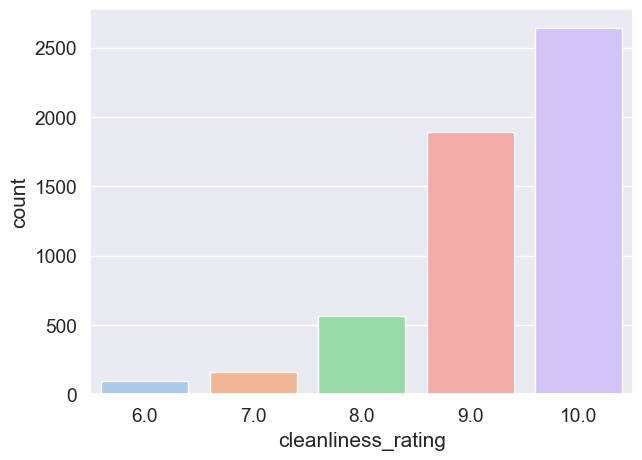

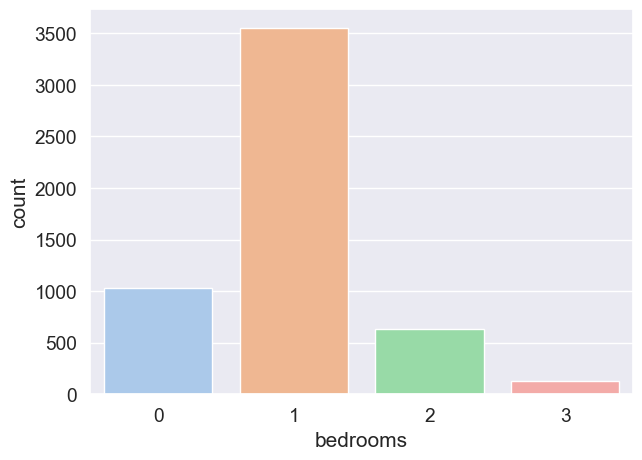

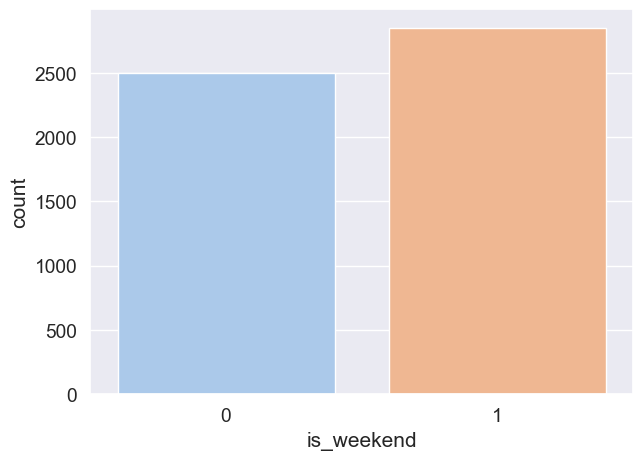

In [135]:
#Plots after categorical changes
Col_b = ['room_type', 'room_private', 'person_capacity', 'host_is_superhost', 'multi', 'biz', 'cleanliness_rating',
         'bedrooms', 'is_weekend']
for col in Col_b:
    plt.figure(figsize=(7, 5))
    sns.countplot(x=col, data=df_paris_train, palette="pastel")
    plt.show()

Continuous Variables

In [137]:
_, longitude_bins_b = pd.qcut(df_paris_train.lng, q=3, retbins=True)  #pretty decent match
longitude_bins_b

df_paris_train["Longitude_disc"] = pd.cut(df_paris_train.lng, longitude_bins_b)

df_paris_train = pd.get_dummies(df_paris_train, columns=["Longitude_disc"], drop_first=False)

_, latitude_bins_b = pd.qcut(df_paris_train.lng, q=3, retbins=True)  #pretty decent match
latitude_bins_b

df_paris_train["Latitude_disc"] = pd.cut(df_paris_train.lng, latitude_bins_b)

df_paris_train = pd.get_dummies(df_paris_train, columns=["Latitude_disc"], drop_first=False)

In [138]:
df_paris_train.sample(20)

,room_type,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,...,lng,lat,is_weekend,realSum_Cut,"Longitude_disc_(2.248, 2.332]","Longitude_disc_(2.332, 2.359]","Longitude_disc_(2.359, 2.439]","Latitude_disc_(2.248, 2.332]","Latitude_disc_(2.332, 2.359]","Latitude_disc_(2.359, 2.439]"
1206,2,0,2.0,0,0,0,9.0,95.0,1,3.194635,...,2.34769,48.88511,0,254.916581,False,True,False,False,True,False
999,2,0,4.0,0,0,1,9.0,86.0,1,1.890115,...,2.33058,48.84790,0,510.066176,True,False,False,True,False,False
4503,2,0,5.0,0,1,0,9.0,87.0,2,2.058546,...,2.34569,48.87449,1,776.633423,False,True,False,False,True,False
1881,2,0,6.0,0,0,0,10.0,100.0,3,1.900835,...,2.37475,48.86560,0,730.030758,False,False,True,False,False,True
4259,2,0,6.0,0,1,0,10.0,96.0,2,1.077073,...,2.33887,48.85340,1,950.461366,False,True,False,False,True,False
643,1,1,2.0,0,0,0,9.0,88.0,0,1.809893,...,2.35853,48.84074,0,344.160686,False,True,False,False,True,False
1594,2,0,2.0,1,0,1,10.0,99.0,1,2.951396,...,2.33700,48.88100,0,394.025538,False,True,False,False,True,False
1996,2,0,2.0,0,0,0,10.0,94.0,1,2.416449,...,2.38142,48.84587,0,265.868208,False,False,True,False,False,True
1604,2,0,4.0,0,0,0,9.0,90.0,1,3.193054,...,2.34578,48.88492,0,288.470501,False,True,False,False,True,False
3483,1,1,2.0,0,0,0,6.0,75.0,1,0.899285,...,2.36232,48.86162,1,255.848635,False,False,True,False,False,True


Data Cleaning

In [140]:
df_paris_train = downcast_dataframe(df_paris_train)


BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 5350 entries, 31 to 3582
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   room_type                      5350 non-null   int64  
 1   room_private                   5350 non-null   int64  
 2   person_capacity                5350 non-null   float64
 3   host_is_superhost              5350 non-null   int64  
 4   multi                          5350 non-null   int64  
 5   biz                            5350 non-null   int64  
 6   cleanliness_rating             5350 non-null   float64
 7   guest_satisfaction_overall     5350 non-null   float64
 8   bedrooms                       5350 non-null   int64  
 9   dist                           5350 non-null   float64
 10  metro_dist                     5350 non-null   float64
 11  lng                            5350 non-null   float64
 12  lat                            5350 

In [141]:
#application of all transformations to out-of-sample dataset
df_paris_test = transformations(df_paris_test, longitude_bins_b, latitude_bins_b)
df_paris_train.columns = clear_names(df_paris_train.columns)
df_paris_test.columns = clear_names(df_paris_test.columns)
df_paris_train.to_csv("data_paris_train.csv", index=False)
df_paris_test.to_csv("data_paris_test.csv", index=False)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 1338 entries, 882 to 6682
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   room_type                      1338 non-null   int64  
 1   room_private                   1338 non-null   int64  
 2   person_capacity                1338 non-null   float64
 3   host_is_superhost              1338 non-null   int64  
 4   multi                          1338 non-null   int64  
 5   biz                            1338 non-null   int64  
 6   cleanliness_rating             1338 non-null   float64
 7   guest_satisfaction_overall     1338 non-null   float64
 8   bedrooms                       1338 non-null   int64  
 9   dist                           1338 non-null   float64
 10  metro_dist                     1338 non-null   float64
 11  attr_index_norm                1338 non-null   float64
 12  rest_index_norm                1338

Feature Selection

In [143]:
general_ranking_paris = feature_selection(df_paris_train, "realsum_cut")

Elastic Net

In [145]:
x_col_b = df_paris_train.columns.tolist()
x_col_b.remove(y_col)

In [146]:
cv_elastic_b = [
    rmse_cv(ElasticNet(alpha=alpha, l1_ratio=l1_ratio), df_paris_train, x_col_b, y_col).mean()
    for (alpha, l1_ratio) in product(alphas, l1_ratios)
]

Text(0, 0.5, 'rmse')

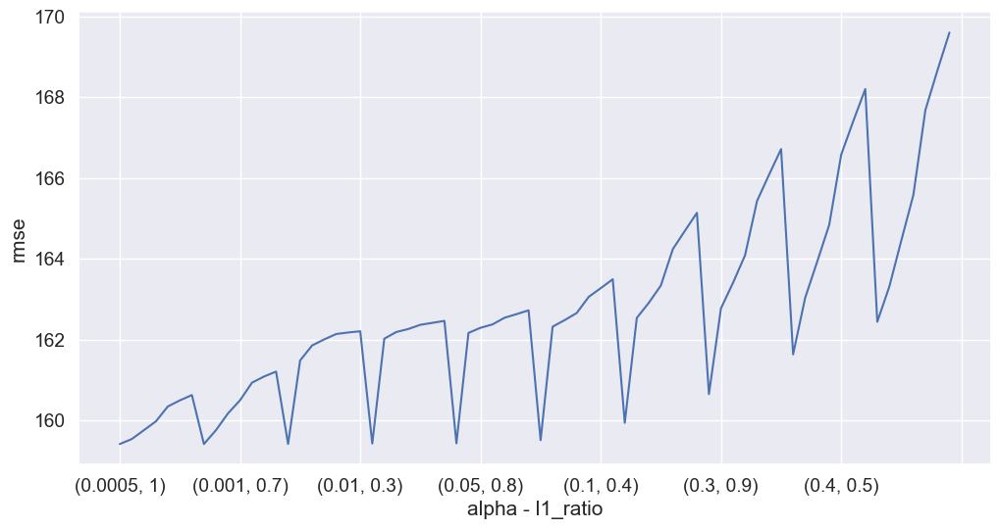

In [147]:
plt.rcParams["figure.figsize"] = (12.0, 6.0)
idx = list(product(alphas, l1_ratios))
p_cv_elastic_b = pd.Series(cv_elastic_b, index=idx)
p_cv_elastic_b.plot()
plt.xlabel("alpha - l1_ratio")
plt.ylabel("rmse")

In [148]:
p_cv_elastic_b

(0.0005, 1)      159.411841
(0.0005, 0.9)    159.534596
(0.0005, 0.8)    159.752136
(0.0005, 0.7)    159.970847
(0.0005, 0.5)    160.341819
                    ...    
(0.5, 0.8)       164.455650
(0.5, 0.7)       165.579871
(0.5, 0.5)       167.682793
(0.5, 0.4)       168.664647
(0.5, 0.3)       169.603220
Length: 70, dtype: float64

In [149]:
elastic_b = ElasticNet(alpha=0.0005, l1_ratio=1)

In [150]:
elastic_b.fit(df_paris_train.loc[:, x_col_b], df_paris_train.loc[:, y_col])

ElasticNet(alpha=0.0005, l1_ratio=1)

In [151]:
coef_b = pd.Series(elastic_b.coef_, index=df_paris_train.loc[:, x_col_b].columns)
imp_coef_b = pd.concat([coef_b.sort_values().head(10), coef_b.sort_values().tail(10)])

In [152]:
imp_coef_b

lng                          -2206.158203
longitude_disc_2_332_2_359     -90.535370
latitude_disc_2_248_2_332      -83.722198
latitude_disc_2_359_2_439      -82.022881
latitude_disc_2_332_2_359      -80.585808
longitude_disc_2_359_2_439     -77.531296
longitude_disc_2_248_2_332     -69.092560
dist                           -49.511333
is_weekend                     -12.052958
room_private                    -0.000868
guest_satisfaction_overall       0.583821
cleanliness_rating              21.465361
host_is_superhost               25.968170
metro_dist                      29.553730
multi                           45.571472
person_capacity                 56.637833
room_type                       79.085907
biz                             80.785667
bedrooms                       106.849434
lat                            181.564697
dtype: float32

In [153]:
general_ranking_paris = pd.merge(
    general_ranking_paris,
    pd.DataFrame(imp_coef_b),
    left_index=True,
    right_index=True,
    how="left",
)
general_ranking_paris.rename(columns={0: "EN_coef"}, inplace=True)

In [154]:
#Boruta
rf = RandomForestRegressor(n_jobs=-1, max_depth=5)
feat_selector = bp(rf, n_estimators="auto", verbose=0, max_iter=100)
feat_selector.fit(df_paris_train.loc[:, x_col_b].values, df_paris_train.loc[:, y_col].values.ravel())

boruta_DF = pd.DataFrame(index=x_col_b)
boruta_DF["boruta_rank"] = feat_selector.ranking_
general_ranking_paris = pd.merge(
    general_ranking_paris, boruta_DF, left_index=True, right_index=True, how="left"
)

In [155]:
general_ranking_paris

,mi_score,f_score,sign,corr,EN_coef,boruta_rank
room_type,0.228036,5.767460e-57,1,0.269512,79.085907,5
room_private,0.225634,5.765933e-57,1,-0.269512,-0.000868,4
person_capacity,0.412795,0.000000e+00,1,0.516975,56.637833,1
host_is_superhost,0.169954,1.198586e-02,1,0.043235,25.968170,3
multi,0.184607,2.233086e-01,0,-0.004393,45.571472,6
biz,0.250828,5.611139e-35,1,0.204213,80.785667,1
cleanliness_rating,0.220663,1.076802e-09,1,0.071942,21.465361,1
guest_satisfaction_overall,0.313700,4.401615e-05,1,0.075172,0.583821,1
bedrooms,0.367391,5.158769e-272,1,0.352037,106.849434,1
dist,0.424356,1.024670e-35,1,-0.239627,-49.511333,1


# Rome

### Data Preprocessing

In [157]:
df_rome_train.describe()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,is_weekend
count,7221.000000,7221.000000,7221.000000,7221.00000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000,7221.000000
mean,205.837956,1.619443,0.001523,0.38208,3.349121,0.327932,0.384850,0.332502,9.515857,93.157734,1.227115,3.044695,0.822763,470.298712,10.420774,1150.269356,25.053155,12.486001,41.895378,0.504639
std,121.721273,0.488685,0.039003,0.48593,1.297818,0.469493,0.486593,0.471143,0.816166,7.796293,0.548926,1.660411,0.632382,299.692167,6.640465,620.173640,13.507312,0.029046,0.018064,0.500013
min,46.057092,1.000000,0.000000,0.00000,2.000000,0.000000,0.000000,0.000000,2.000000,20.000000,0.000000,0.042789,0.011101,84.811373,1.879034,233.018570,5.073485,12.400790,41.818000,0.000000
25%,138.405069,1.000000,0.000000,0.00000,2.000000,0.000000,0.000000,0.000000,9.000000,91.000000,1.000000,1.892301,0.326117,242.134967,5.365270,654.475286,14.255154,12.467430,41.884060,0.000000
50%,182.591822,2.000000,0.000000,0.00000,3.000000,0.000000,0.000000,0.000000,10.000000,95.000000,1.000000,2.815720,0.628020,403.159038,8.933747,974.126151,21.209830,12.479940,41.897370,1.000000
75%,241.039908,2.000000,0.000000,1.00000,4.000000,1.000000,1.000000,1.000000,10.000000,98.000000,1.000000,4.051207,1.220437,627.742556,13.910899,1547.600139,33.703422,12.505500,41.907190,1.000000
max,2418.348023,3.000000,1.000000,1.00000,6.000000,1.000000,1.000000,1.000000,10.000000,100.000000,4.000000,9.553819,4.147201,4513.563486,100.000000,4592.883342,100.000000,12.582980,41.951780,1.000000


<Axes: >

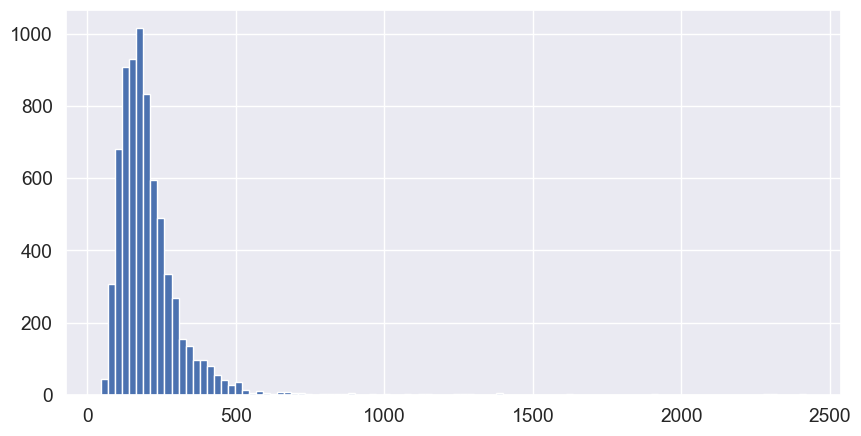

In [158]:
df_rome_train.realSum.hist(bins=100, figsize=(10, 5))

In [159]:
{i: df_rome_train.realSum.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(321.4644752530802),
 np.float64(0.91): np.float64(332.2656816215836),
 np.float64(0.92): np.float64(343.44095574310893),
 np.float64(0.93): np.float64(357.23470413578656),
 np.float64(0.9400000000000001): np.float64(377.06029504594),
 np.float64(0.9500000000000001): np.float64(392.06976363593856),
 np.float64(0.9600000000000001): np.float64(413.0643162742867),
 np.float64(0.9700000000000001): np.float64(439.0620251092979),
 np.float64(0.9800000000000001): np.float64(483.80988006452696),
 np.float64(0.9900000000000001): np.float64(573.5861407897526)}

In [160]:
cutoff_realSum_b = df_rome_train.realSum.quantile(0.99)
df_rome_train['realSum_Cut'] = df_rome_train['realSum'].clip(upper=cutoff_realSum_b)

In [161]:
df_rome_train[df_rome_train['realSum'] >= df_rome_train.realSum.quantile(0.99)].shape

(73, 22)

<Axes: >

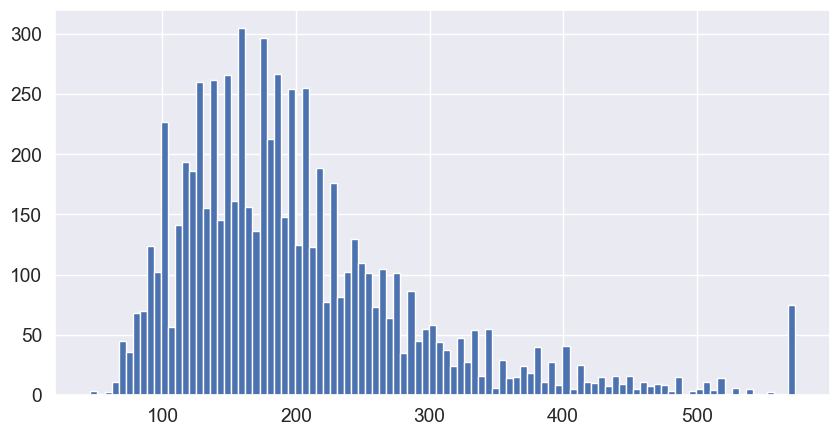

In [162]:
df_rome_train.realSum_Cut.hist(bins=100, figsize=(10, 5))

In [163]:
df_rome_train=df_rome_train.drop(columns=["realSum"])
df_rome_train = df_rome_train.drop(columns=["City"])

In [164]:
#Dropping out initial indices as we have standardized forms
df_rome_train=df_rome_train.drop(columns=["attr_index", 'attr_index_norm'])
df_rome_train=df_rome_train.drop(columns=["rest_index", 'rest_index_norm'])

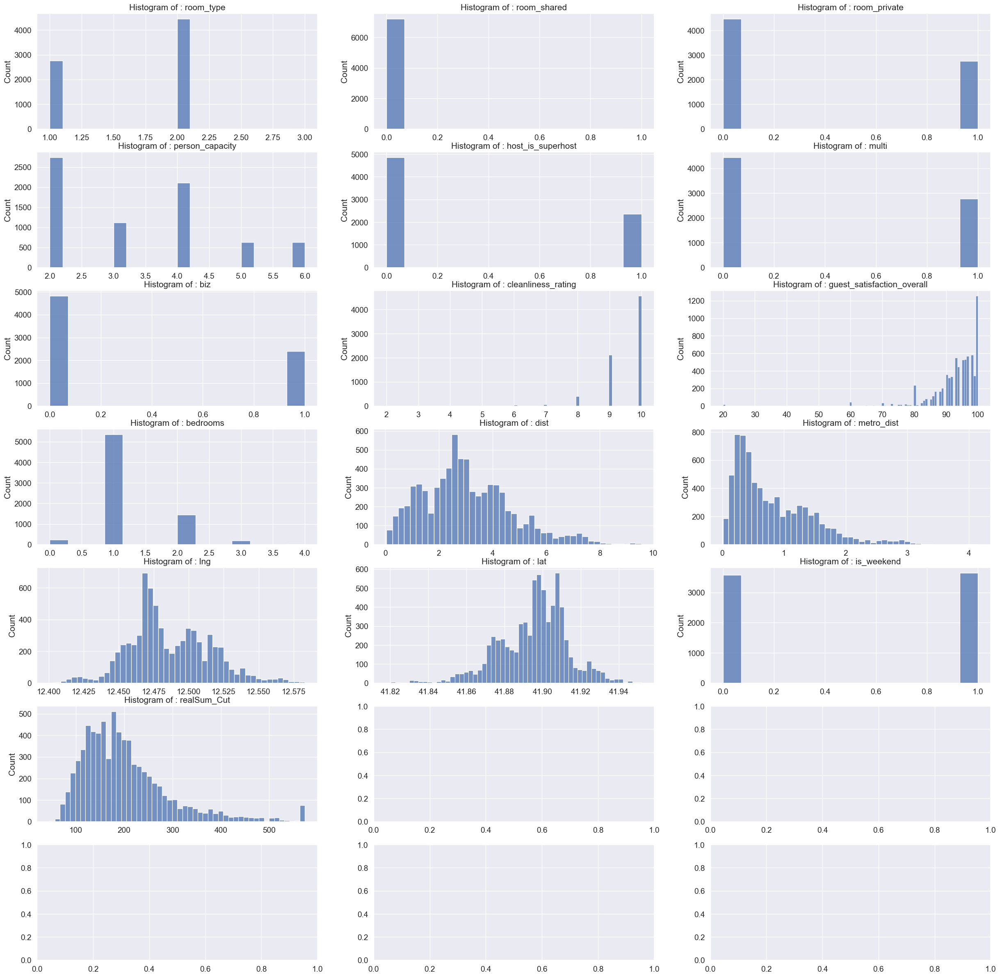

In [165]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_rome_train.columns, axes.flat):
    sns.histplot(x=df_rome_train[i], ax=ax).set(title=f"Histogram of : {i}", xlabel="")
plt.show()

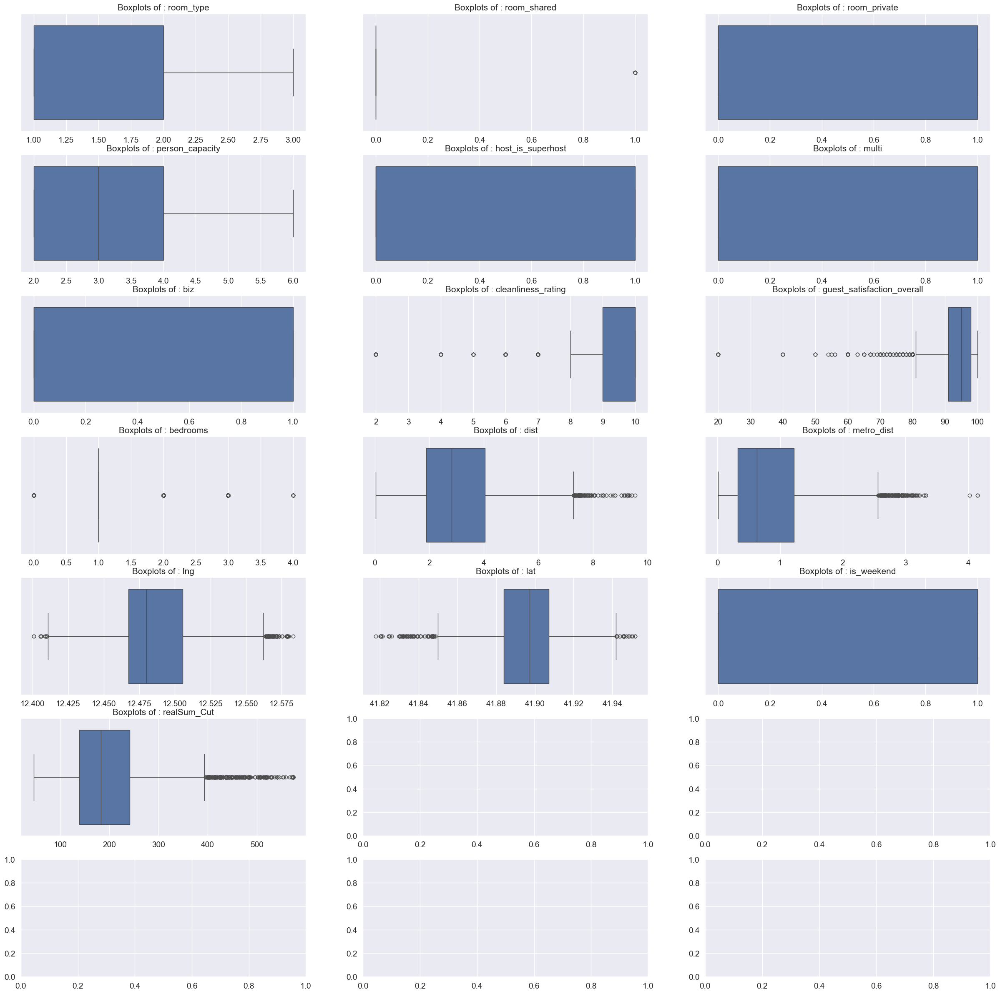

In [166]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_rome_train.columns, axes.flat):
    sns.boxplot(x=df_rome_train[i], ax=ax).set(title=f"Boxplots of : {i}", xlabel="")
plt.show()

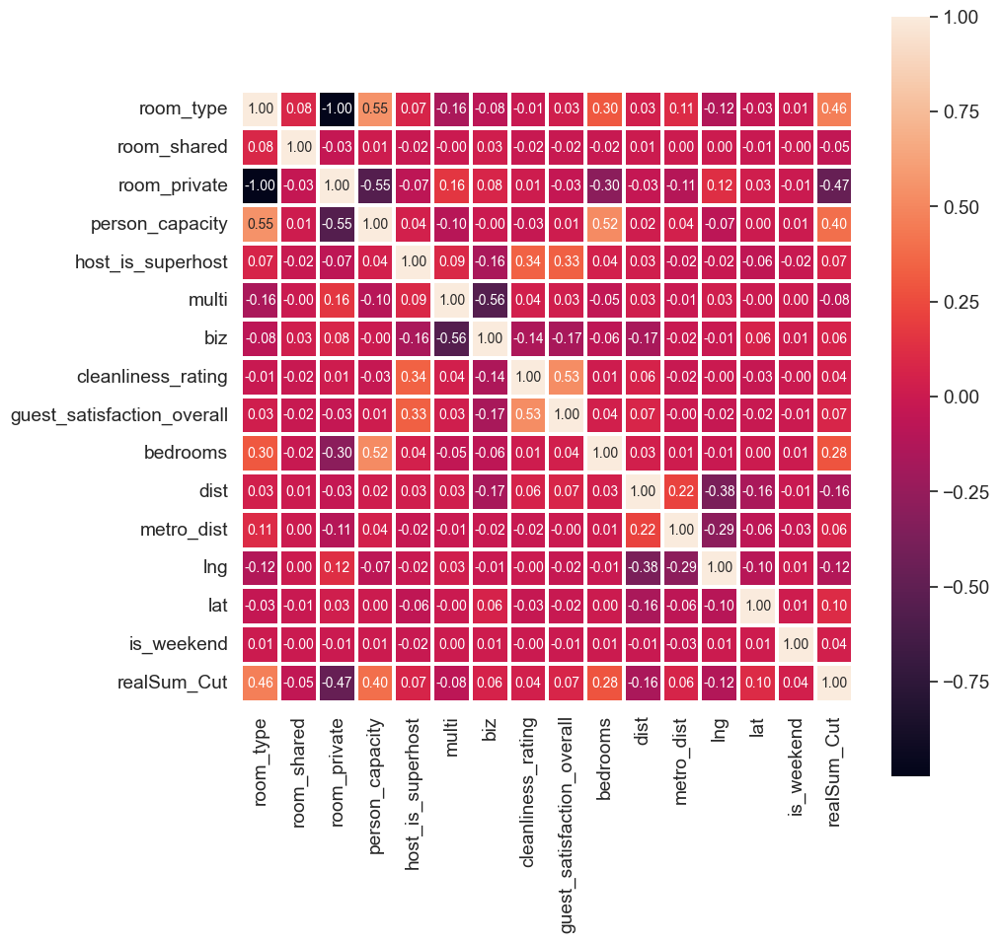

In [167]:
corr_b = df_rome_train.corr(method="kendall")

#Heatmap
plt.figure(figsize=(10, 10))
sns.set(font_scale=1.25)
sns.heatmap(
    corr_b, linewidths=1.5, annot=True, square=True, fmt=".2f", annot_kws={"size": 10}
)
plt.show()

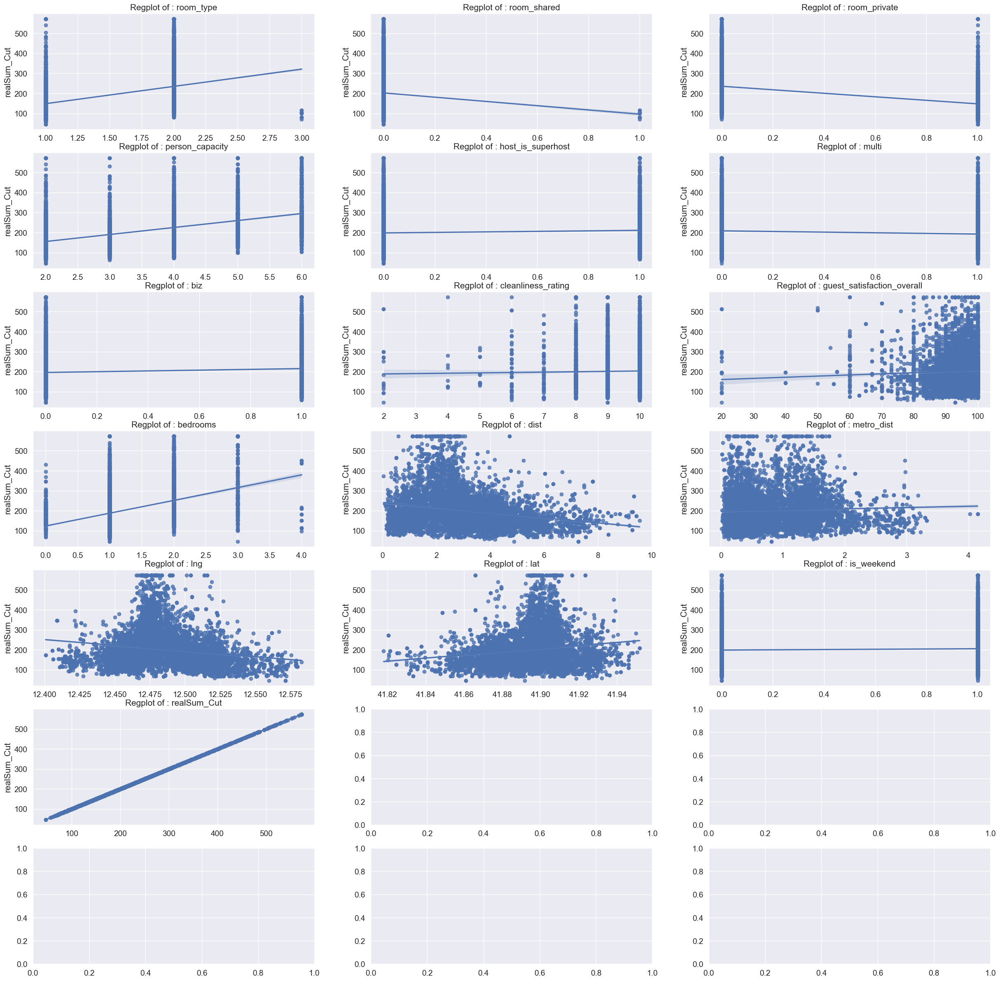

In [168]:
fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(30, 30))
for i, ax in zip(df_rome_train.columns, axes.flat):
    sns.regplot(x=df_rome_train[i], y=df_rome_train["realSum_Cut"], ax=ax).set(title=f"Regplot of : {i}",
                                                                                         xlabel="")
plt.show()

In [169]:
import plotly.express as px

fig = px.density_mapbox(df_rome_train, lat="lat", lon="lng", z="realSum_Cut",
                        radius=12, zoom=12, mapbox_style='open-street-map', opacity=0.5, width=1000, height=800,
                        title="Density of AirBnb offers in rome")
fig.show()

Categorical Variables

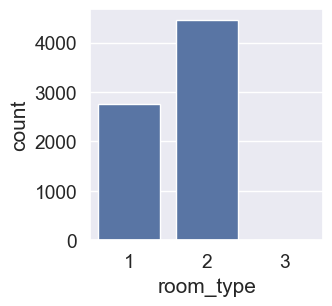

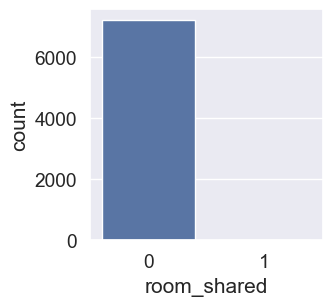

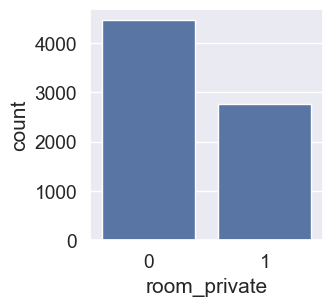

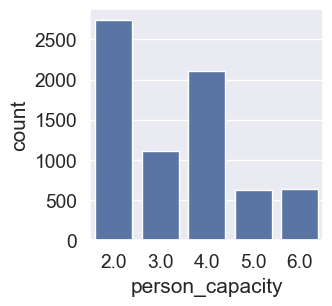

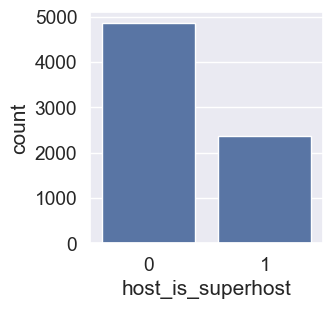

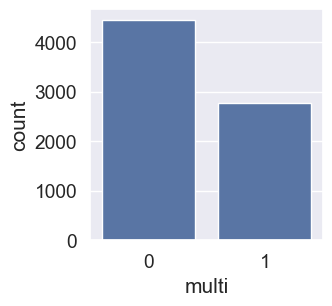

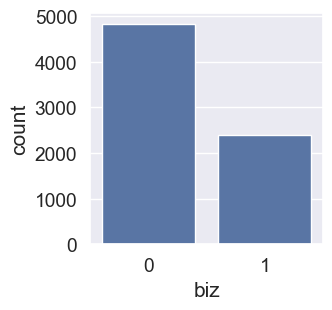

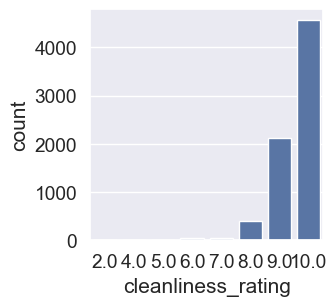

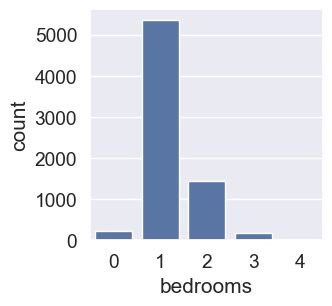

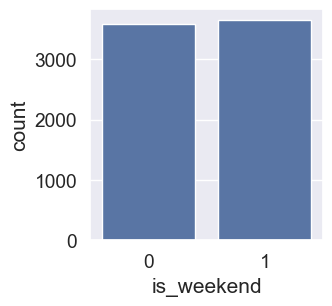

In [171]:
#Plots for categorical variables
Col_b = ['room_type', 'room_shared', 'room_private', 'person_capacity', 'host_is_superhost', 'multi', 'biz',
         'cleanliness_rating', 'bedrooms', 'is_weekend']
for col in Col_b:
    plt.figure(figsize=(3, 3))
    sns.countplot(x=col, data=df_rome_train)
    plt.show()

In [172]:
df_rome_train.bedrooms.describe()

count    7221.000000
mean        1.227115
std         0.548926
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         4.000000
Name: bedrooms, dtype: float64

In [173]:
{i: df_rome_train.bedrooms.quantile(i) for i in np.arange(0.9, 1.0, 0.01)}

{np.float64(0.9): np.float64(2.0),
 np.float64(0.91): np.float64(2.0),
 np.float64(0.92): np.float64(2.0),
 np.float64(0.93): np.float64(2.0),
 np.float64(0.9400000000000001): np.float64(2.0),
 np.float64(0.9500000000000001): np.float64(2.0),
 np.float64(0.9600000000000001): np.float64(2.0),
 np.float64(0.9700000000000001): np.float64(2.0),
 np.float64(0.9800000000000001): np.float64(3.0),
 np.float64(0.9900000000000001): np.float64(3.0)}

In [174]:
cutoff_bedrooms_b = df_rome_train.bedrooms.quantile(0.99)
df_rome_train['bedrooms'] = df_rome_train['bedrooms'].clip(upper=cutoff_bedrooms_b)

In [175]:
df_rome_train.cleanliness_rating.describe()

count    7221.000000
mean        9.515857
std         0.816166
min         2.000000
25%         9.000000
50%        10.000000
75%        10.000000
max        10.000000
Name: cleanliness_rating, dtype: float64

In [176]:
{i: df_rome_train.cleanliness_rating.quantile(i) for i in np.arange(0.0, 0.1, 0.01)}

{np.float64(0.0): np.float64(2.0),
 np.float64(0.01): np.float64(6.0),
 np.float64(0.02): np.float64(8.0),
 np.float64(0.03): np.float64(8.0),
 np.float64(0.04): np.float64(8.0),
 np.float64(0.05): np.float64(8.0),
 np.float64(0.06): np.float64(8.0),
 np.float64(0.07): np.float64(8.0),
 np.float64(0.08): np.float64(9.0),
 np.float64(0.09): np.float64(9.0)}

In [177]:
cutoff_cleanliness_rating_b = df_rome_train.cleanliness_rating.quantile(0.02)
df_rome_train['cleanliness_rating'] = df_rome_train['cleanliness_rating'].clip(
    lower=cutoff_cleanliness_rating_b)

In [178]:
df_rome_train = df_rome_train.drop(columns=["room_shared"])

In [179]:
#room_type: Let's drop out "other" (3) category (we will incorporate it with 2 category)
df_rome_train['room_type'] = df_rome_train['room_type'].clip(upper=2)

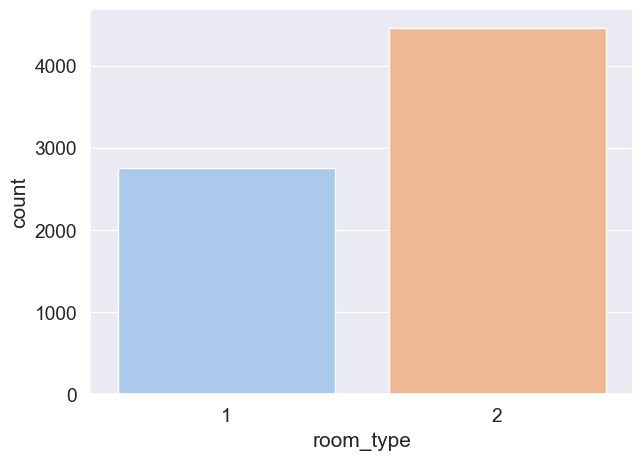

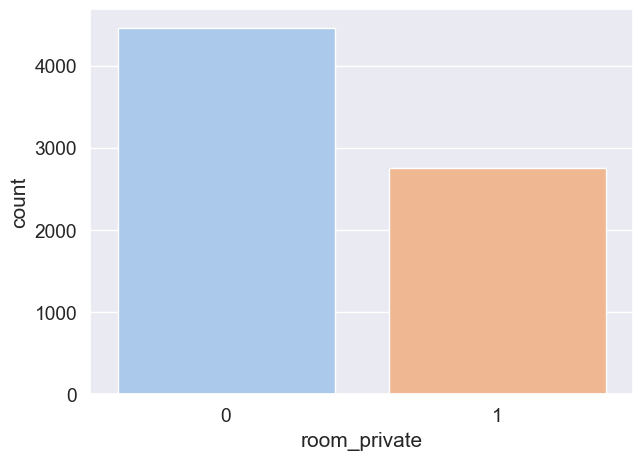

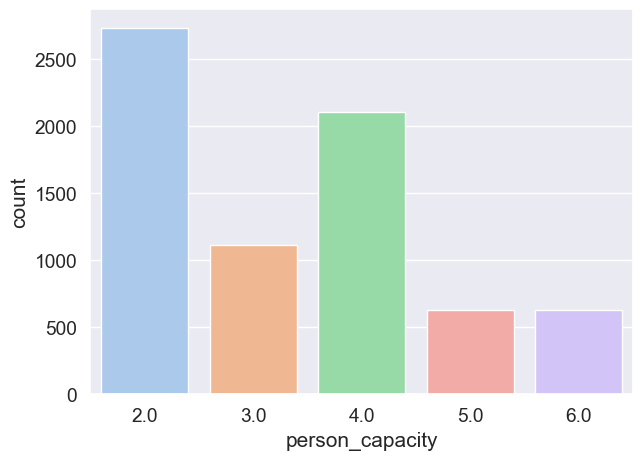

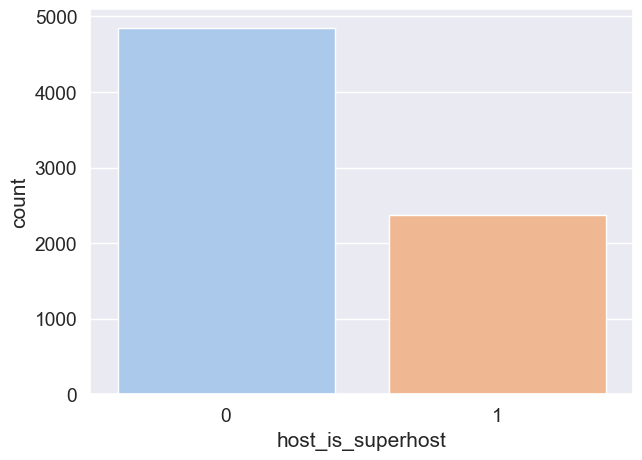

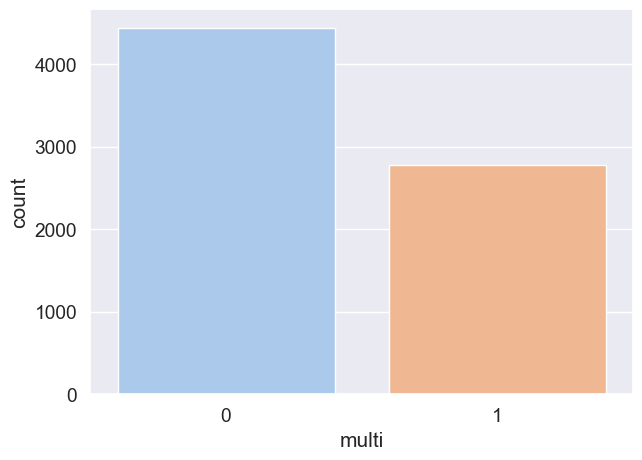

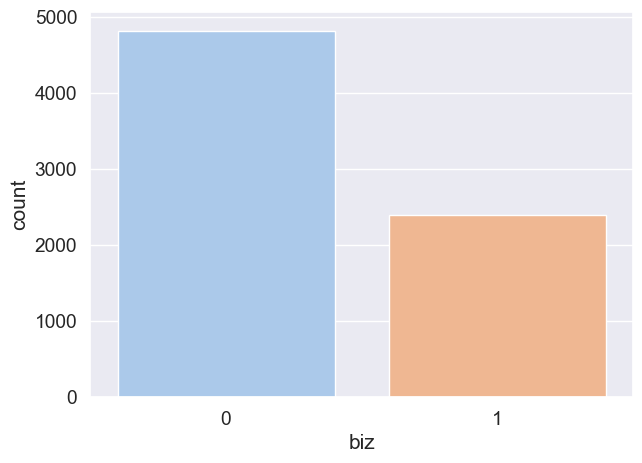

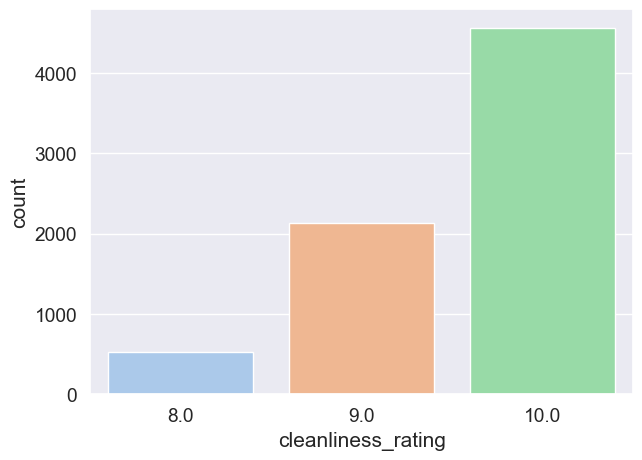

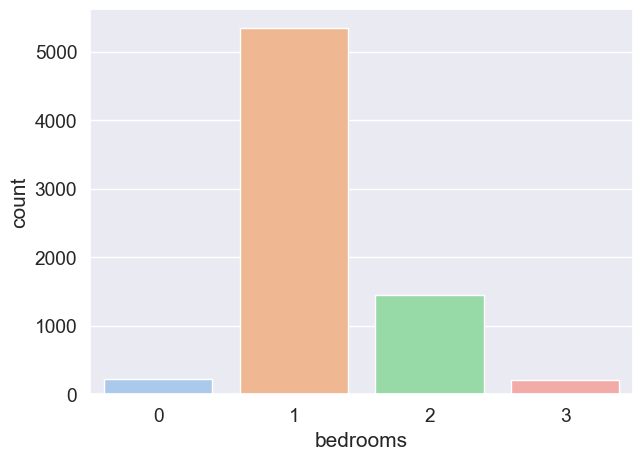

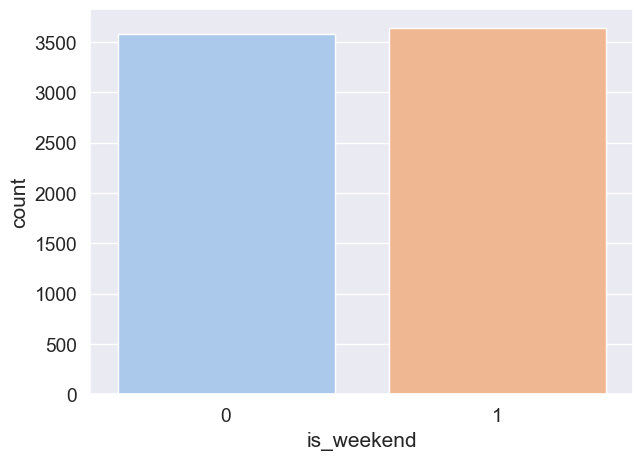

In [180]:
#Plots after categorical changes
Col_b = ['room_type', 'room_private', 'person_capacity', 'host_is_superhost', 'multi', 'biz', 'cleanliness_rating',
         'bedrooms', 'is_weekend']
for col in Col_b:
    plt.figure(figsize=(7, 5))
    sns.countplot(x=col, data=df_rome_train, palette="pastel")
    plt.show()

Continuous Variables

In [182]:
_, longitude_bins_b = pd.qcut(df_rome_train.lng, q=3, retbins=True)  #pretty decent match
longitude_bins_b

df_rome_train["Longitude_disc"] = pd.cut(df_rome_train.lng, longitude_bins_b)

df_rome_train = pd.get_dummies(df_rome_train, columns=["Longitude_disc"], drop_first=False)

_, latitude_bins_b = pd.qcut(df_rome_train.lng, q=3, retbins=True)  #pretty decent match
latitude_bins_b

df_rome_train["Latitude_disc"] = pd.cut(df_rome_train.lng, latitude_bins_b)

df_rome_train = pd.get_dummies(df_rome_train, columns=["Latitude_disc"], drop_first=False)

In [183]:
df_rome_train.sample(20)

,room_type,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,...,lng,lat,is_weekend,realSum_Cut,"Longitude_disc_(12.401, 12.471]","Longitude_disc_(12.471, 12.499]","Longitude_disc_(12.499, 12.583]","Latitude_disc_(12.401, 12.471]","Latitude_disc_(12.471, 12.499]","Latitude_disc_(12.499, 12.583]"
6305,2,0,4.0,1,0,0,10.0,100.0,1,5.422469,...,12.43733,41.89536,1,184.462161,True,False,False,True,False,False
8674,1,1,2.0,0,0,1,10.0,100.0,1,0.390923,...,12.50220,41.90439,1,150.328478,False,False,True,False,False,True
284,1,1,2.0,0,0,0,8.0,80.0,1,7.466187,...,12.41823,41.92493,0,126.715451,True,False,False,True,False,False
8393,1,1,2.0,0,0,1,10.0,100.0,1,3.504461,...,12.48262,41.87294,1,173.473920,False,True,False,False,True,False
1389,1,1,2.0,0,1,0,9.0,95.0,1,5.310731,...,12.44200,41.91700,0,90.010053,True,False,False,True,False,False
4637,1,1,3.0,0,0,1,10.0,90.0,1,2.377124,...,12.51800,41.88300,1,165.992565,False,False,True,False,False,True
7757,2,0,3.0,0,0,0,10.0,90.0,1,1.861835,...,12.50824,41.88472,1,165.291188,False,False,True,False,False,True
5651,1,1,5.0,0,0,1,10.0,100.0,1,5.750768,...,12.54800,41.86200,1,158.978795,False,False,True,False,False,True
122,1,1,2.0,0,1,0,10.0,95.0,1,5.362049,...,12.54764,41.86653,0,126.715451,False,False,True,False,False,True
1225,2,0,2.0,1,0,0,9.0,91.0,1,3.286792,...,12.46566,41.88955,0,201.762794,True,False,False,True,False,False


Data Cleaning

In [185]:
df_rome_train = downcast_dataframe(df_rome_train)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 7221 entries, 583 to 3582
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   room_type                        7221 non-null   int64  
 1   room_private                     7221 non-null   int64  
 2   person_capacity                  7221 non-null   float64
 3   host_is_superhost                7221 non-null   int64  
 4   multi                            7221 non-null   int64  
 5   biz                              7221 non-null   int64  
 6   cleanliness_rating               7221 non-null   float64
 7   guest_satisfaction_overall       7221 non-null   float64
 8   bedrooms                         7221 non-null   int64  
 9   dist                             7221 non-null   float64
 10  metro_dist                       7221 non-null   float64
 11  lng                              7221 non-null   float64
 12  lat    

In [186]:
#application of all transformations to out-of-sample dataset
df_rome_test = transformations(df_rome_test, longitude_bins_b, latitude_bins_b)
df_rome_train.columns = clear_names(df_rome_train.columns)
df_rome_test.columns = clear_names(df_rome_test.columns)
df_rome_train.to_csv("data_rome_train.csv", index=False)
df_rome_test.to_csv("data_rome_test.csv", index=False)

BEFORE downcast
<class 'pandas.core.frame.DataFrame'>
Index: 1806 entries, 7558 to 5409
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   room_type                        1806 non-null   int64  
 1   room_private                     1806 non-null   int64  
 2   person_capacity                  1806 non-null   float64
 3   host_is_superhost                1806 non-null   int64  
 4   multi                            1806 non-null   int64  
 5   biz                              1806 non-null   int64  
 6   cleanliness_rating               1806 non-null   float64
 7   guest_satisfaction_overall       1806 non-null   float64
 8   bedrooms                         1806 non-null   int64  
 9   dist                             1806 non-null   float64
 10  metro_dist                       1806 non-null   float64
 11  attr_index_norm                  1806 non-null   float64
 12  rest_i

Feature Selection

In [188]:
general_ranking_rome = feature_selection(df_rome_train, "realsum_cut")

Elastic Net

In [190]:
x_col_b = df_rome_train.columns.tolist()
x_col_b.remove(y_col)

In [191]:

cv_elastic_b = [
    rmse_cv(ElasticNet(alpha=alpha, l1_ratio=l1_ratio), df_rome_train, x_col_b, y_col).mean()
    for (alpha, l1_ratio) in product(alphas, l1_ratios)
]

Text(0, 0.5, 'rmse')

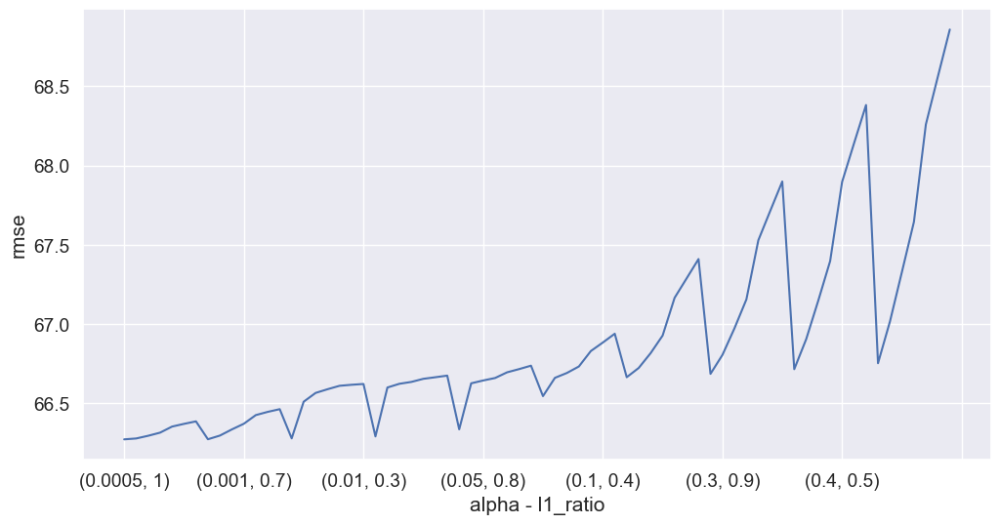

In [192]:
plt.rcParams["figure.figsize"] = (12.0, 6.0)
idx = list(product(alphas, l1_ratios))
p_cv_elastic_b = pd.Series(cv_elastic_b, index=idx)
p_cv_elastic_b.plot()
plt.xlabel("alpha - l1_ratio")
plt.ylabel("rmse")

In [193]:
p_cv_elastic_b

(0.0005, 1)      66.270968
(0.0005, 0.9)    66.276488
(0.0005, 0.8)    66.293455
(0.0005, 0.7)    66.313227
(0.0005, 0.5)    66.351503
                   ...    
(0.5, 0.8)       67.328281
(0.5, 0.7)       67.643575
(0.5, 0.5)       68.259449
(0.5, 0.4)       68.560251
(0.5, 0.3)       68.858412
Length: 70, dtype: float64

In [194]:
elastic_b = ElasticNet(alpha=0.0005, l1_ratio=1)

In [195]:
elastic_b.fit(df_rome_train.loc[:, x_col_b], df_rome_train.loc[:, y_col])

ElasticNet(alpha=0.0005, l1_ratio=1)

In [196]:
coef_b = pd.Series(elastic_b.coef_, index=df_rome_train.loc[:, x_col_b].columns)
imp_coef_b = pd.concat([coef_b.sort_values().head(10), coef_b.sort_values().tail(10)])

In [197]:
imp_coef_b

longitude_disc_12_499_12_583    -59.904129
latitude_disc_12_471_12_499     -35.507168
longitude_disc_12_401_12_471    -28.339560
latitude_disc_12_499_12_583     -28.058449
latitude_disc_12_401_12_471     -20.138746
dist                            -12.212154
room_private                     -0.000000
guest_satisfaction_overall        0.241685
host_is_superhost                 4.944411
is_weekend                        5.238546
metro_dist                        6.524281
cleanliness_rating                7.414135
multi                            11.802547
person_capacity                  14.289948
biz                              18.555641
longitude_disc_12_471_12_499     21.771338
bedrooms                         35.924362
room_type                        46.677677
lng                              73.713661
lat                             439.430634
dtype: float32

In [198]:
general_ranking_rome = pd.merge(
    general_ranking_rome,
    pd.DataFrame(imp_coef_b),
    left_index=True,
    right_index=True,
    how="left",
)
general_ranking_rome.rename(columns={0: "EN_coef"}, inplace=True)

In [199]:
#Boruta
rf = RandomForestRegressor(n_jobs=-1, max_depth=5)
feat_selector = bp(rf, n_estimators="auto", verbose=0, max_iter=100)
feat_selector.fit(df_rome_train.loc[:, x_col_b].values, df_rome_train.loc[:, y_col].values.ravel())

boruta_DF = pd.DataFrame(index=x_col_b)
boruta_DF["boruta_rank"] = feat_selector.ranking_
general_ranking_rome = pd.merge(
    general_ranking_rome, boruta_DF, left_index=True, right_index=True, how="left"
)

In [200]:
general_ranking.to_csv('data/output/general_ranking.csv')
general_ranking_barcelona.to_csv('data/output/general_ranking_barcelona.csv')
general_ranking_paris.to_csv('data/output/general_ranking_paris.csv')
general_ranking_rome.to_csv('data/output/general_ranking_rome.csv')